# **Unveiling Claim Severity and Fraud Harnessing Unsupervised Machine Learning**


**Course Name:**       Machine Learning (Unsupervised Learning 2)                      
**Assignment Title:** MLUL2 Group Assignment     
**Submitted by:** Group-04

**Student names in the Group-04**

*   Krishna Vikranth Kumar Nadipalli (PGID: 12410002)
*   Challa Dhanunjaya Reddy (PGID: 12320006)
*   Raheem Shaik (PGID: 12410035)
*   Ambika Venkatesan (PGID: 12410054)

 **Project Title:** Unveiling Claim Severity and Fraud Harnessing Unsupervised Machine Learning

**Overview**

The Vehicle Claims data contains records of claims related to vehicle incidents, oﬀering rich insights into the nature of claims, their patterns, and potential anomalies. To utlize unsupervised machine learning techniques to identfy anomalous claims, discover associatons, and observe seasonality trends in issues using vehicle claims data, aiming to enhance fraud detecton, perform risk assessment for strategic decision-making for insurance companies. This project aims to provide a comprehensive soluton for detecting and mitigating fraudulent claims, ultimately leading to more eﬀective and strategic management of insurance claims.

**Steps for Implementation**


1.   Data Preprocessing
2.   Anomaly Detection for identifying anomalous claims
3.   Association Rule Mining for identifying common and frequent issues of the vehicles
4.   Temporal Clustering and Seasonality Trend Analysis using Clustering techniques



In [ ]:
!pip install ydata_profiling

In [ ]:
!pip install apriori

In [2]:
!pip install ydata_profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.9/390.9 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 31.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 49.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=c47a4f0ce2394c62d323bd376fa57aa36acf5f95a616e4f40d61e09eab44e81d
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [3]:
# importing necessary packages
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
import re
import warnings
warnings.filterwarnings('ignore')
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import classification_report,make_scorer,accuracy_score,confusion_matrix,f1_score, precision_score, recall_score
from sklearn.neighbors import LocalOutlierFactor
from sklearn.covariance import EllipticEnvelope
from sklearn.model_selection import train_test_split, KFold
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from ydata_profiling import ProfileReport

from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import fpgrowth

import zipfile


### Loading the dataset in dataframe

Total number of records identified from the dataset are 2,68,255.

In [4]:
# Loading the dataset
file_path = 'vehicle_claims.csv'
# Load the CSV file directly into a DataFrame
data_df = pd.read_csv(file_path)

print("Total no. of records in the dataset", len(data_df))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Total no. of records in the dataset 268255


### Dataset columns information

In [5]:
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268255 entries, 0 to 268254
Data columns (total 23 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Maker              268255 non-null  object 
 1    Genmodel          268255 non-null  object 
 2    Genmodel_ID       268255 non-null  object 
 3   Adv_year           268255 non-null  int64  
 4   Adv_month          268255 non-null  int64  
 5   Color              268255 non-null  object 
 6   Reg_year           268255 non-null  float64
 7   Bodytype           268255 non-null  object 
 8   Runned_Miles       268255 non-null  object 
 9   Engin_size         268255 non-null  object 
 10  Gearbox            268255 non-null  object 
 11  Fuel_type          268255 non-null  object 
 12  Price              268255 non-null  float64
 13  Seat_num           268255 non-null  float64
 14  Door_num           268255 non-null  float64
 15  issue              268255 non-null  object 
 16  is

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### **1. Data Preprocessing**

The following columns were identified for data cleanup. The steps and explanations are outlined below.

### Step 1:
* **Genmodel:** This column contains numeric, alpha, date, and alphanumeric values representing car models.
* **Genmodel_ID:** This column provides unique numeric IDs corresponding to the car models.

To simplify these columns, a dictionary mapping **Genmodel** to **Genmodel_ID** will be created and used for future analysis or feature engineering. The **Genmodel** column will be dropped and use **Genmodel_ID** to represent model.
### Step 2:
* **Reg_year:** Represents the car's registration year. Valid values range between 1900 and the current year (2024).

There are 7 records with a registration year of 3010 were found, which is invalid. So, Rows with invalid **Reg_year** values will be excluded on the dataset.

### Step 3:
- **Runned_Miles** -  Represents the total miles a car has run. Valid values must be numeric and non-negative.

Identified 258 records non numberic values and 1048 records with negative values. Removing these 1306 records from the dataset would not give much data loss in total dataset i.e 268255.

### Step 4:
- **Engine_Size** -  This column represents size of the car's engine.

The column contains outliers such as 2998.0L, 1400.0L, and 3500.0L, which significantly differ from the rest of the data. A total of 2,054 records with outliers were identified. These records will be removed, as they constitute a minor portion of the dataset.

### Step 5:
- **Price** -  Represents the car's price. Valid values must be numeric and non-negative.

Identified 1022 records with negative values that needs to be filtered out from the dataset.

### Step 6:
- **repair_cost** -  Represents the repair cost of the car. Valid values must be numeric and non-negative.

Identified 105 records with negative values that needs to be filtered out from the dataset.

### Step 7:
Dropping unwanted columns **Adv_year**, **Adv_month**, **Adv_day** as they are already represented a date column i.e **repair date**

### Step 8:
- **Days_to_Repair** -  This calculated column represents the repair duration in days. It is derived from the difference between repair_date and breakdown_date using the formula: Days_to_Repair = repair_date - breakdown_date.





In [6]:
def data_cleanup(data):
  """
    Data cleanup for all invalid data and drop unwanted colums as expalined above 1 to 8 steps.

    Args:
        df (pandas.DataFrame): The DataFrame to process.

    Returns:
        tuple: A tuple containing:
            - dict: A dictionary mapping 'Genmodel_ID' to 'Genmodel'.
            - pandas.DataFrame: The DataFrame with the 'Genmodel' column dropped, 'Days_to_Repair' column created,
              and 'Adv_year', 'Adv_month', 'Adv_day' columns removed.
  """
  print('Dataset size before cleanup:',len(data))

  # Removing extra space on the column name for 'Genmodel_ID'
  data.columns = data.columns.str.strip()

  # Step 1
  # Create a dictionary mapping Genmodel to Genmodel_ID
  genmodel_dict = dict(zip(data['Genmodel'], data['Genmodel_ID']))
  # Drop the Genmodel column from the dataset
  data.drop(columns=['Genmodel'], inplace=True)

  # Step 2
  # Remove rows with invalid Reg_year
  current_year = pd.Timestamp.now().year
  data = data[~((data['Reg_year'] < 1900) | (data['Reg_year'] > current_year))]
  # Reset the index after removal
  data.reset_index(drop=True, inplace=True)

  # Step 3
  # Remove alphanumeric rows
  data = data[~data['Runned_Miles'].apply(lambda x: bool(re.search(r'[A-Za-z]', str(x))) and bool(re.search(r'\d', str(x))))]
  # Convert the column to numeric, setting non-numeric values to NaN
  data['Runned_Miles'] = pd.to_numeric(data['Runned_Miles'], errors='coerce')
  # Filter rows where the column has values greater than zero
  negative_vals = data[data['Runned_Miles'] < 0]

  # Step 4
  # Converting values to numeric
  data['Engin_size'] = data['Engin_size'].str.replace('L', '').astype(float)
  # Remove rows with outliers in Engin_Size
  data = data[data['Engin_size'] <= 10]

  # Step 5
  # Remove rows with negatives in Price column
  data = data[data['Price'] > 0]

  # Step 6
  # Remove rows with outliers in Engin_Size
  data = data[data['repair_cost'] >= 0]

  # Step 7
  # Drop unwanted columns 'Adv_year', 'Adv_month', 'Adv_day' as they are already combined as one column i.e repair date
  data.drop(columns=['Adv_year', 'Adv_month', 'Adv_day'], inplace=True)

  # Step 8
  # Calculate repair duration in days from repair_date and breakdown_date columns
  data['Days_to_Repair'] = (pd.to_datetime(data['repair_date']) - pd.to_datetime(data['breakdown_date'])).dt.days


  print('Dataset size after cleanup:',len(data))

  return genmodel_dict, data


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [7]:
genmodel_dict, df_cleaned = data_cleanup(data_df)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Dataset size before cleanup: 268255
Dataset size after cleanup: 264809


In [8]:
data_df.columns

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['Maker', 'Genmodel_ID', 'Adv_year', 'Adv_month', 'Color', 'Reg_year',
       'Bodytype', 'Runned_Miles', 'Engin_size', 'Gearbox', 'Fuel_type',
       'Price', 'Seat_num', 'Door_num', 'issue', 'issue_id', 'Adv_day',
       'breakdown_date', 'repair_complexity', 'repair_cost', 'repair_hours',
       'repair_date'],
      dtype='object')

In [9]:
def plot_bar_chart(df, column_name):
    """
    Plots a bar chart for the given column in the DataFrame.

    Args:
        df (pandas.DataFrame): The DataFrame containing the column.
        column_name (str): The name of the column to create the bar chart for.

    Returns:
        None: Displays the bar chart for the specified column.
    """
    # Check if the column exists in the DataFrame
    if column_name not in df.columns:
        print(f"Error: '{column_name}' column not found in the DataFrame.")
        return

    # Count the occurrences of unique values in the specified column
    value_counts = df[column_name].value_counts()

    # Create the bar chart
    plt.figure(figsize=(10, 6))
    sns.barplot(x=value_counts.index, y=value_counts.values, palette='viridis')

    # Add title and labels
    plt.title(f'Bar Chart of {column_name}', fontsize=16)
    plt.xlabel(column_name, fontsize=14)
    plt.ylabel('Count', fontsize=14)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')

    # Display the plot
    plt.tight_layout()  # To ensure everything fits in the figure area
    plt.show()

def plot_boxplot(df, column_name):
    """
    Generates a box plot for the specified column in the DataFrame to identify outliers.

    Args:
        df (pandas.DataFrame): The DataFrame containing the data.
        column_name (str): The name of the column to create a box plot for.

    Returns:
        None: Displays the box plot.
    """
    # Check if the column exists in the DataFrame
    if column_name not in df.columns:
        print(f"Error: The column '{column_name}' does not exist in the DataFrame.")
        return

    # Create the boxplot
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[column_name], color='lightblue')

    # Add title and labels
    plt.title(f'Box Plot for {column_name}')
    plt.xlabel(column_name)

    # Display the plot
    plt.show()

def plot_histogram(df, column_name, bins=50):
    """
    Generates a histogram for the specified column in the DataFrame to visualize the distribution of data.

    Args:
        df (pandas.DataFrame): The DataFrame containing the data.
        column_name (str): The name of the column to create a histogram for.
        bins (int): The number of bins to use in the histogram (default is 10).

    Returns:
        None: Displays the histogram.
    """
    # Check if the column exists in the DataFrame
    if column_name not in df.columns:
        print(f"Error: The column '{column_name}' does not exist in the DataFrame.")
        return

    # Create the histogram
    plt.figure(figsize=(8, 6))
    sns.histplot(df[column_name], bins=bins, kde=True, color='skyblue', edgecolor='black')

    # Add title and labels
    plt.title(f'Histogram for {column_name}')
    plt.xlabel(column_name)
    plt.ylabel('Frequency')

    # Display the plot
    plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


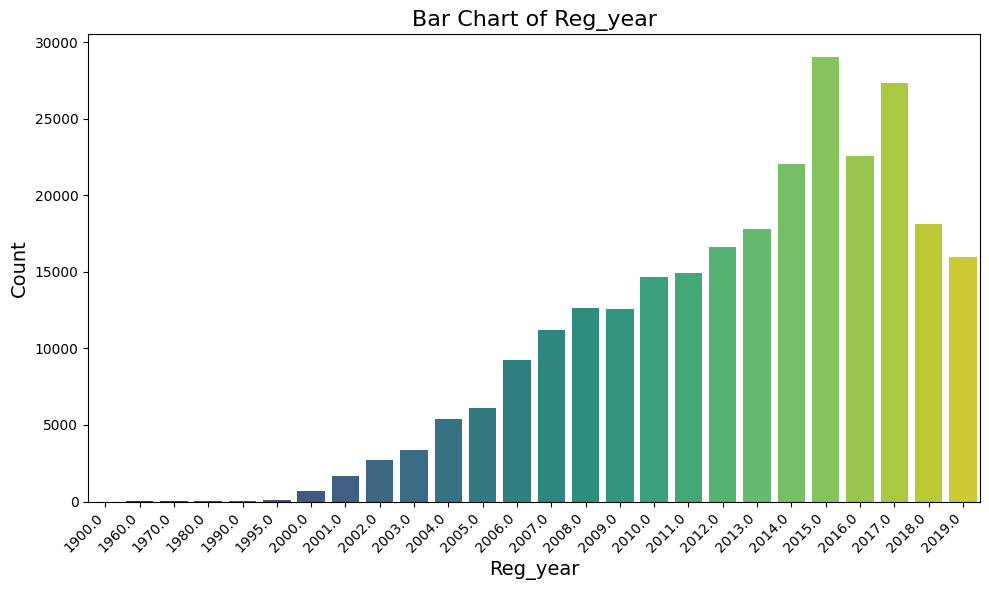

In [16]:
plot_bar_chart(df_cleaned,'Reg_year')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


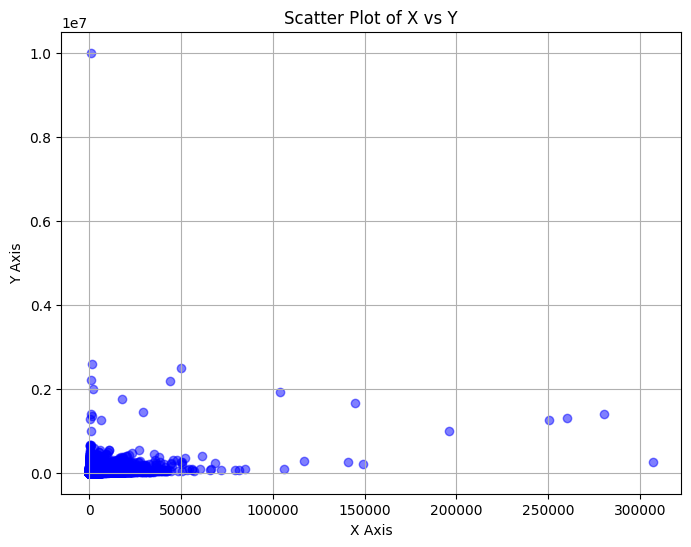

In [12]:
# Create a scatter plot using matplotlib
plt.figure(figsize=(8, 6))
plt.scatter(df_cleaned['repair_cost'], df_cleaned['Price'], color='blue', alpha=0.5)  # Adjust column names as needed
plt.title('Scatter Plot of X vs Y')
plt.xlabel('X Axis')
plt.ylabel('Y Axis')
plt.grid(True)
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


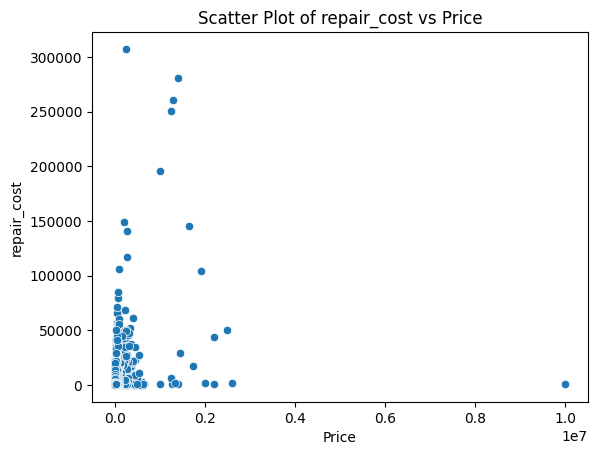

In [14]:
# Create a scatter plot of two columns
sns.scatterplot(data=df_cleaned, x='Price', y='repair_cost')

# Add titles and labels
plt.title("Scatter Plot of repair_cost vs Price")
plt.ylabel("repair_cost")
plt.xlabel("Price")

plt.show()

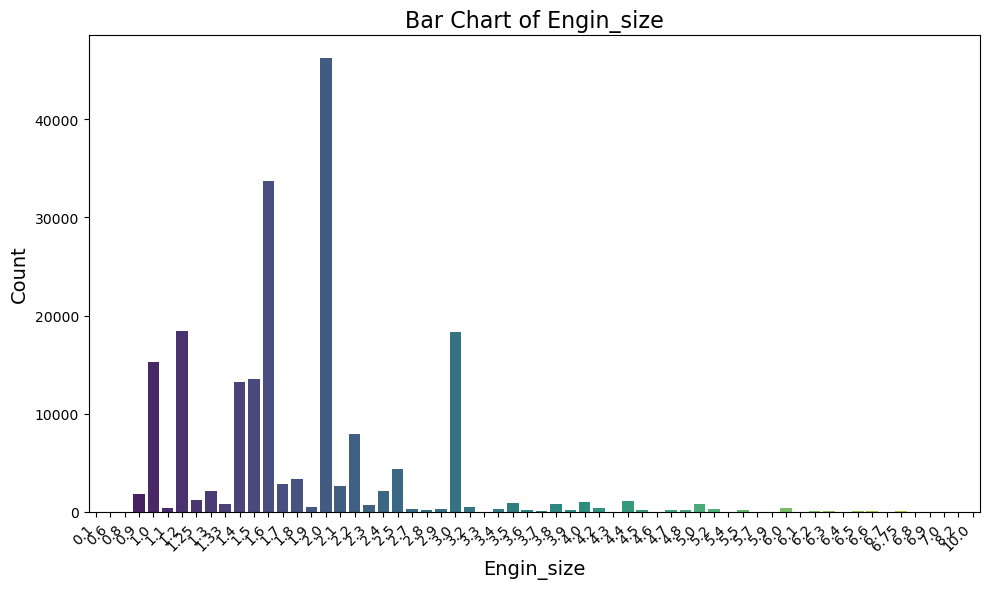

In [ ]:
plot_bar_chart(df_cleaned,'Engin_size')

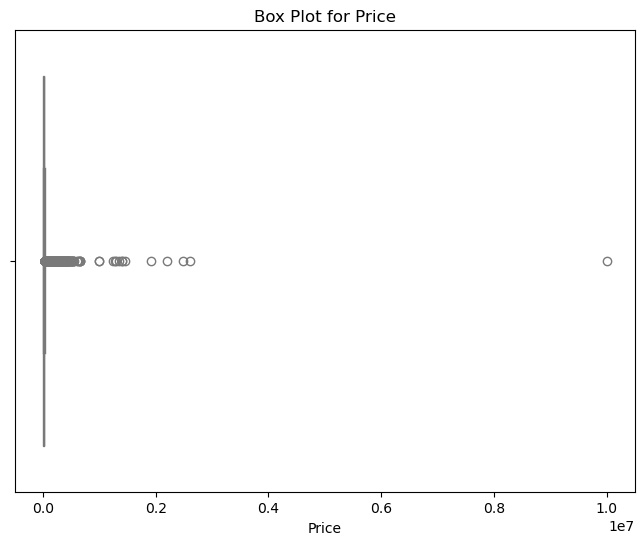

In [ ]:
plot_boxplot(df_cleaned,'Price')

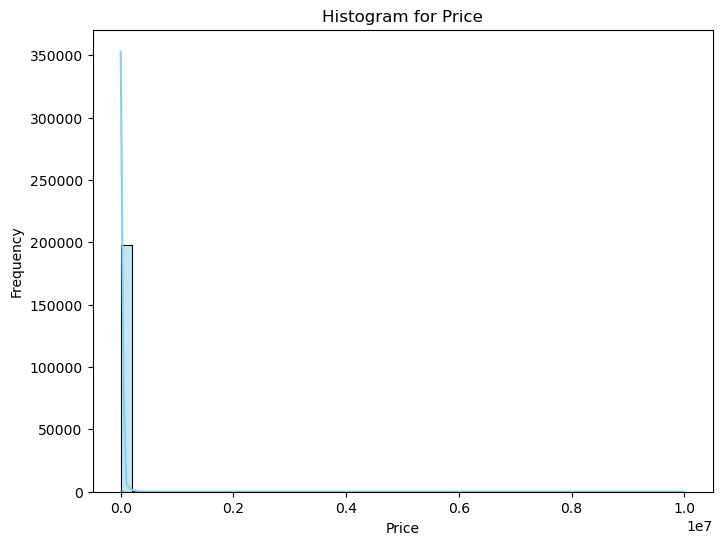

In [ ]:
plot_histogram(df_cleaned,'Price')

In [19]:
issues_by_price = df_cleaned[['repair_cost','issue']].groupby('issue').sum().sort_values(by='repair_cost', ascending=False).reset_index()
print(issues_by_price)

                     issue   repair_cost
0             Engine Issue  5.014287e+07
1       Sensor Malfunction  1.913926e+07
2            Warning Light  9.447525e+06
3       Alternator Failing  8.460256e+06
4         Radiator Leaking  8.378974e+06
5      Starter Motor Issue  5.506741e+06
6       Transmission Issue  5.440074e+06
7           Gear Box Issue  4.714314e+06
8         Electrical Issue  1.957670e+06
9          Brake Pads Worn  1.460024e+06
10  Steering Wheel Shaking  1.008192e+06
11     Excessive Emissions  9.728719e+05
12        Windscreen Crack  8.536046e+05
13              Flat Tyres  7.575868e+05
14          Tyre Alignment  3.637748e+05


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


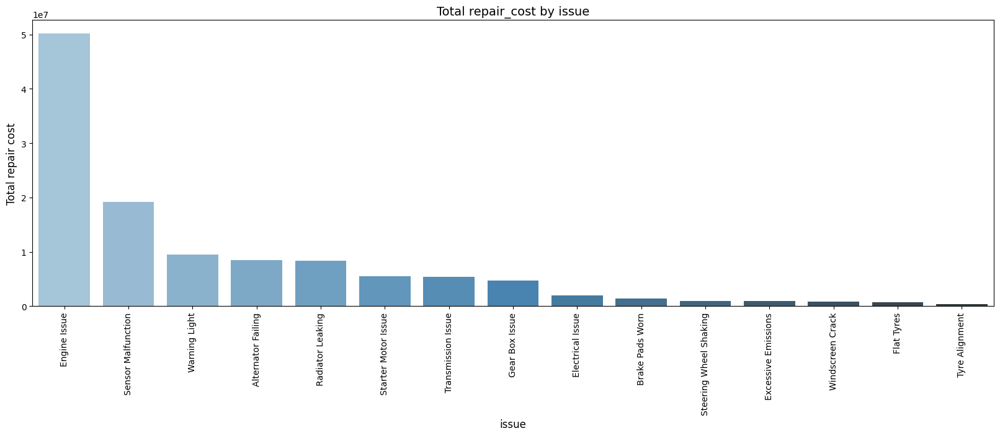

In [20]:
plt.figure(figsize=(20, 6))
sns.barplot(data=issues_by_price, x='issue', y='repair_cost', palette='Blues_d')

plt.xticks(rotation=90)

# Add labels and title
plt.title('Total repair_cost by issue', fontsize=14)
plt.xlabel('issue', fontsize=12)
plt.ylabel('Total repair cost', fontsize=12)

# Show the plot
plt.show()

In [22]:
# Profiling using yprofiling
profile = ProfileReport(df_cleaned, title="Pandas Profiling Report")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [23]:
profile.to_notebook_iframe()
# Exporting profiling report as a file
profile.to_file("profiling_report.html")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### Defining Schema for the dataset and save to file **vehicle_claims_preprocessed.csv**

In [24]:
# Define data types for schema
data_schema = {
    "Maker": "string",
    "Genmodel_ID": "string",
    "Color": "string",
    "Reg_year": "int64",
    "Bodytype": "string",
    "Runned_Miles": "float64",
    "Engin_size": "float64",
    "Gearbox": "string",
    "Fuel_type": "string",
    "Price": "float64",
    "Seat_num": "int64",
    "Door_num": "int64",
    "issue": "string",
    "repair_complexity": "int64",
    "repair_cost": "float64",
    "repair_hours": "float64",
    "breakdown_date": "datetime64[ns]",
    "repair_date": "datetime64[ns]",
    "Days_to_Repair": "int64",
}

# Apply the schema to the DataFrame
filtered_df = df_cleaned.astype(data_schema)
filtered_df.shape
filtered_df.to_csv('vehicle_claims_preprocessed.csv')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Feature Engineering and Data Scaling for categorical, numerical and date columns

**Numerical Data** - 'Reg_year', 'Runned_Miles', 'Engin_size', 'Price', 'Seat_num', 'Door_num', 'issue_id', 'repair_complexity', 'repair_cost', 'repair_hours', 'Days_to_Repair'. Applied Standard scaling.

**Categorial Data** - 'Maker', 'Genmodel_ID', 'Color', 'Bodytype', 'Gearbox', 'Fuel_type', 'issue'. Applied encoding OneHotEncoder.

**Date type Data** - 'breakdown_date', 'repair_date'. Applied encoding OneHotEncoder. Convert dates to numeric.

Created a pipleline

In [25]:
# Feature Engineering: Scaling

# Define preprocessing for different types of columns
# For numeric columns (float, int)
numeric_features = filtered_df.select_dtypes(include=['float64', 'int64']).columns.tolist()

# For date columns (we'll convert them to the number of days since 1970)
def date_to_numeric(df):
    reference_date = pd.to_datetime('1970-01-01')
    for col in df.select_dtypes(include=['datetime64[ns]']).columns:
        df[col] = (df[col] - reference_date).dt.days
    return df

date_features = filtered_df.select_dtypes(include=['datetime64[ns]']).columns.tolist()

# For categorical columns (we'll use One-Hot Encoding)
categorical_features = filtered_df.select_dtypes(include=['string']).columns.tolist()

# Build a pipeline with appropriate transformers
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features),  # Apply StandardScaler to numeric columns
        ('date', FunctionTransformer(date_to_numeric), date_features),  # Convert dates to numeric
        ('cat', OneHotEncoder(drop='first', sparse_output=False, dtype='int64'), categorical_features)  # Apply OneHotEncoding to categorical columns
    ])

# Apply transformations in one go using a pipeline
# You can now apply the transformations using the pipeline
pipeline = Pipeline(steps=[('preprocessor', preprocessor)])

# Transform the dataset
transformed_data = pipeline.fit_transform(filtered_df)

# Convert transformed data back to DataFrame
columns = numeric_features + date_features + pipeline.named_steps['preprocessor'].transformers_[2][1].get_feature_names_out(categorical_features).tolist()
scaled_df = pd.DataFrame(transformed_data, columns=columns)

# Show the columns data for all types
print("Numerical Data columns", numeric_features)
print("Categorical Data columns", categorical_features)
print("Date columns", date_features)

# Show the scaled DataFrame shape
print(scaled_df.shape)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Numerical Data columns ['Reg_year', 'Runned_Miles', 'Engin_size', 'Price', 'Seat_num', 'Door_num', 'issue_id', 'repair_complexity', 'repair_cost', 'repair_hours', 'Days_to_Repair']
Categorical Data columns ['Maker', 'Genmodel_ID', 'Color', 'Bodytype', 'Gearbox', 'Fuel_type', 'issue']
Date columns ['breakdown_date', 'repair_date']
(264809, 1023)


## 2. Anomaly Detection for identifying anomalous claims

1. Feature engineering and feature columns selection
2. Train and Test data split
3. Scaling using Standard Scaler and Label encoding for categorical data
4. Models execution
  *   Isolation Forest
  *   Elliptic Envelope
  *   Local Outlier Factor

5. Compare results



### Considering data from 2010 to find the anomalies in vehicle insurance claims

In [26]:

# Load the raw dataset to work on anomaly
file_path = 'vehicle_claims_preprocessed.csv'
data = pd.read_csv(file_path)
data = data[data['Reg_year'] >= 2000] # Considering car registration data last few years to find the anomalies in vehicle insurance claims

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [27]:
#define the target column
data['anomaly']=0

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [28]:
X = data.drop(columns=['anomaly'])
y = data['anomaly']
# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Label encoding for the categorical columns

In [29]:
label_encoders = {}
for column in X_train.select_dtypes(include=['object','string']).columns:
    label_encoders[column] = LabelEncoder()
    X_train[column] = label_encoders[column].fit_transform(X_train[column])

# Scale numerical features
scaler = StandardScaler()
numerical_columns = X_train.select_dtypes(include=['float64', 'int64']).columns
X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])
eX_train=X_train
lX_train=X_train
print(X_train)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


        Unnamed: 0     Maker  Genmodel_ID     Color  Reg_year  Bodytype  \
213353    1.069638  1.315087     1.114635 -1.173294  0.521014 -0.914687   
215470    1.096917  1.315087     1.148208  1.351350 -0.154911 -0.914687   
241757    1.437226  1.396376     1.332860 -0.163437 -0.380220 -0.610673   
130829   -0.021909  0.542850     0.082258 -1.173294  1.196940 -0.610673   
221366    1.173049  1.355731     1.211158 -0.542133 -0.154911 -0.610673   
...            ...       ...          ...       ...       ...       ...   
119965   -0.169704  0.380273    -0.085608 -1.173294  0.971631  1.213415   
259308    1.663858  1.437020     1.479743 -0.415901 -0.154911  1.213415   
132022   -0.006440  0.542850     0.086455  1.098885  0.070397  1.213415   
146972    0.186769  0.705426     0.313074 -1.173294  0.295706 -0.610673   
122048   -0.135521  0.380273    -0.073018  0.972653 -0.830837 -0.610673   

        Runned_Miles  Engin_size   Gearbox  Fuel_type  ...  Seat_num  \
213353     -0.657786   -0.1

**Isolation Forest**

In [30]:
iso_forest = IsolationForest(n_estimators=100, contamination=0.05, random_state=42)
iso_forest.fit(X_train)

# Predict anomalies
X_train['anomaly'] = iso_forest.predict(X_train)
X_train['anomaly'] = X_train['anomaly'].apply(lambda x: 1 if x == -1 else 0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [31]:
#finding accuracy,precision,recall,f1 using kfold cross validation

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_accuracy = []
cv_precision = []
cv_recall = []
cv_f1 = []

for train_idx, val_idx in kf.split(X_train):
    X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_train_fold, y_val_fold = X_train['anomaly'].iloc[train_idx], X_train['anomaly'].iloc[val_idx]

    iso_forest_fold = IsolationForest(n_estimators=100, contamination=0.05, random_state=42)
    iso_forest_fold.fit(X_train_fold)

    val_labels = iso_forest_fold.predict(X_val_fold)
    val_labels = np.where(val_labels == -1, 1, 0)

    accuracy = accuracy_score(y_val_fold, val_labels)
    precision = precision_score(y_val_fold, val_labels)
    recall = recall_score(y_val_fold, val_labels)
    f1 = f1_score(y_val_fold, val_labels)

    cv_accuracy.append(accuracy)
    cv_precision.append(precision)
    cv_recall.append(recall)
    cv_f1.append(f1)

mean_accuracy = np.mean(cv_accuracy)
std_accuracy = np.std(cv_accuracy)
mean_precision = np.mean(cv_precision)
std_precision = np.std(cv_precision)
mean_recall = np.mean(cv_recall)
std_recall = np.std(cv_recall)
mean_f1 = np.mean(cv_f1)
std_f1 = np.std(cv_f1)

print(f"Accuracy: {mean_accuracy:.2f} ± {std_accuracy:.2f}")
print(f"Precision: {mean_precision:.2f} ± {std_precision:.2f}")
print(f"Recall: {mean_recall:.2f} ± {std_recall:.2f}")
print(f"F1 Score: {mean_f1:.2f} ± {std_f1:.2f}")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Accuracy: 1.00 ± 0.00
Precision: 0.97 ± 0.01
Recall: 0.97 ± 0.01
F1 Score: 0.97 ± 0.01


**Elliptic Envelope**

In [32]:
elliptic_env = EllipticEnvelope(contamination=0.05, random_state=42)
elliptic_env.fit(eX_train)

# Predict anomalies
eX_train['anomaly'] = elliptic_env.predict(eX_train)
eX_train['anomaly'] = eX_train['anomaly'].apply(lambda x: 1 if x == -1 else 0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [33]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
ecv_accuracy = []
ecv_precision = []
ecv_recall = []
ecv_f1 = []

for train_idx, val_idx in kf.split(eX_train):
    X_train_fold, X_val_fold = eX_train.iloc[train_idx], eX_train.iloc[val_idx]
    y_train_fold, y_val_fold = eX_train['anomaly'].iloc[train_idx], eX_train['anomaly'].iloc[val_idx]

    elliptic_env_fold = EllipticEnvelope(contamination=0.05, random_state=42)
    elliptic_env_fold.fit(X_train_fold)

    val_labels = elliptic_env_fold.predict(X_val_fold)
    val_labels = np.where(val_labels == -1, 1, 0)

    accuracy = accuracy_score(y_val_fold, val_labels)
    precision = precision_score(y_val_fold, val_labels)
    recall = recall_score(y_val_fold, val_labels)
    f1 = f1_score(y_val_fold, val_labels)

    ecv_accuracy.append(accuracy)
    ecv_precision.append(precision)
    ecv_recall.append(recall)
    ecv_f1.append(f1)

emean_accuracy = np.mean(ecv_accuracy)
estd_accuracy = np.std(ecv_accuracy)
emean_precision = np.mean(ecv_precision)
estd_precision = np.std(ecv_precision)
emean_recall = np.mean(ecv_recall)
estd_recall = np.std(ecv_recall)
emean_f1 = np.mean(ecv_f1)
estd_f1 = np.std(ecv_f1)

print(f"Accuracy: {emean_accuracy:.2f} ± {estd_accuracy:.2f}")
print(f"Precision: {emean_precision:.2f} ± {estd_precision:.2f}")
print(f"Recall: {emean_recall:.2f} ± {estd_recall:.2f}")
print(f"F1 Score: {emean_f1:.2f} ± {estd_f1:.2f}")

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Accuracy: 0.99 ± 0.00
Precision: 0.92 ± 0.01
Recall: 0.91 ± 0.01
F1 Score: 0.91 ± 0.01


**Local Outlier Factor**

In [34]:
lof = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
lX_train['anomaly'] = lof.fit_predict(lX_train)
lX_train['anomaly'] = lX_train['anomaly'].apply(lambda x: 1 if x == -1 else 0)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [35]:
kf = KFold(n_splits=5, shuffle=True, random_state=42)
lcv_accuracy = []
lcv_precision = []
lcv_recall = []
lcv_f1 = []

for train_idx, val_idx in kf.split(lX_train):
    X_train_fold, X_val_fold = lX_train.iloc[train_idx], lX_train.iloc[val_idx]
    y_train_fold, y_val_fold = lX_train['anomaly'].iloc[train_idx], lX_train['anomaly'].iloc[val_idx]

    lof_fold = LocalOutlierFactor(n_neighbors=20, contamination=0.05)
    val_labels = lof_fold.fit_predict(X_val_fold)
    val_labels = np.where(val_labels == -1, 1, 0)

    accuracy = accuracy_score(y_val_fold, val_labels)
    precision = precision_score(y_val_fold, val_labels)
    recall = recall_score(y_val_fold, val_labels)
    f1 = f1_score(y_val_fold, val_labels)

    lcv_accuracy.append(accuracy)
    lcv_precision.append(precision)
    lcv_recall.append(recall)
    lcv_f1.append(f1)

lmean_accuracy = np.mean(lcv_accuracy)
lstd_accuracy = np.std(lcv_accuracy)
lmean_precision = np.mean(lcv_precision)
lstd_precision = np.std(lcv_precision)
lmean_recall = np.mean(lcv_recall)
lstd_recall = np.std(lcv_recall)
lmean_f1 = np.mean(lcv_f1)
lstd_f1 = np.std(lcv_f1)

print(f"Accuracy: {lmean_accuracy:.2f} ± {lstd_accuracy:.2f}")
print(f"Precision: {lmean_precision:.2f} ± {lstd_precision:.2f}")
print(f"Recall: {lmean_recall:.2f} ± {lstd_recall:.2f}")
print(f"F1 Score: {lmean_f1:.2f} ± {lstd_f1:.2f}")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Accuracy: 0.97 ± 0.00
Precision: 0.67 ± 0.01
Recall: 0.67 ± 0.01
F1 Score: 0.67 ± 0.01


### **Compare Accuracy, precision, recall and f1 across anomaly models**


In [36]:
models = ['Isolation Forest', 'Elliptic Envelope', 'LOF']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']

# Mean values for each metric
means = {
    'Isolation Forest': [mean_accuracy,mean_precision,mean_recall,mean_f1],
    'Elliptic Envelope': [emean_accuracy,emean_precision,emean_recall,emean_f1],
    'LOF': [lmean_accuracy,lmean_precision,lmean_recall,lmean_f1]
}

# Standard deviations for each metric
std_devs = {
    'Isolation Forest': [std_accuracy,std_precision,std_recall,std_f1],
    'Elliptic Envelope': [0.01, 0.02, 0.02, 0.02],
    'LOF': [0.00, 0.01, 0.01, 0.01]
}


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


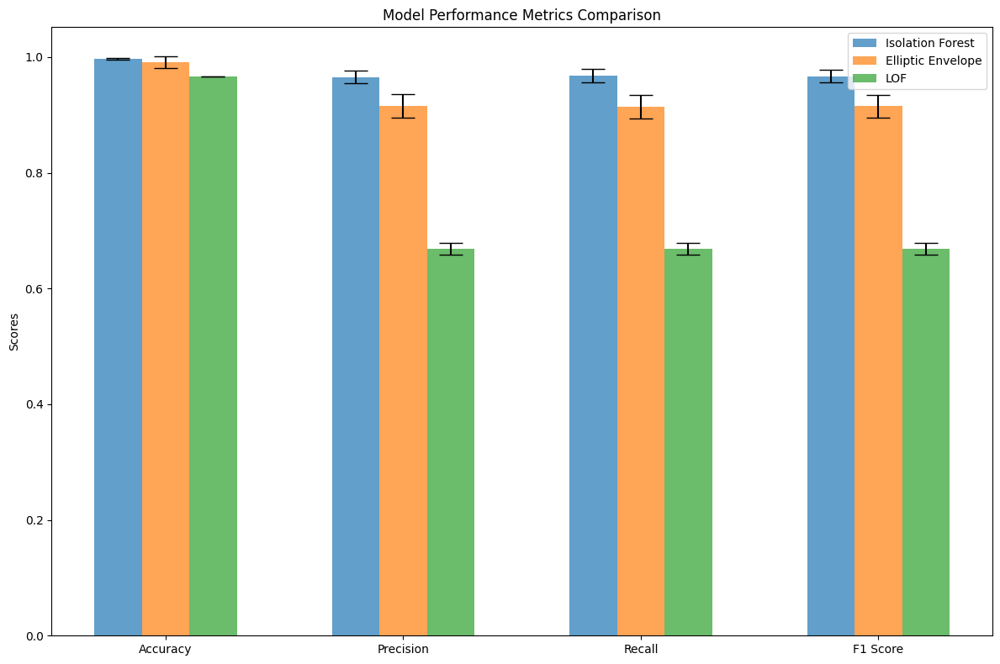

In [37]:
# Create a bar plot for each metric
x_pos = np.arange(len(metrics))
bar_width = 0.2

fig, ax = plt.subplots(figsize=(12, 8))

for i, model in enumerate(models):
    ax.bar(x_pos + i * bar_width, means[model], yerr=std_devs[model], align='center', alpha=0.7, ecolor='black', capsize=10, width=bar_width, label=model)

ax.set_ylabel('Scores')
ax.set_xticks(x_pos + bar_width)
ax.set_xticklabels(metrics)
ax.set_title('Model Performance Metrics Comparison')
ax.legend()

# Save the figure and show
plt.tight_layout()
plt.show()

### **Run the test data against selected model Isolation forest and identify anomalies**

In [38]:
#scale the test data
label_encoders = {}
for column in X_test.select_dtypes(include=['object']).columns:
    label_encoders[column] = LabelEncoder()
    X_test[column] = label_encoders[column].fit_transform(X_test[column])

# Scale numerical features
scaler = StandardScaler()
numerical_columns = X_test.select_dtypes(include=['float64', 'int64']).columns
X_test[numerical_columns] = scaler.fit_transform(X_test[numerical_columns])

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [39]:

test_labels = iso_forest.fit_predict(X_test)
test_labels = np.where(test_labels == -1, 1, 0)
test_accuracy = accuracy_score(y_test, test_labels)
test_precision = precision_score(y_test, test_labels)
test_recall = recall_score(y_test, test_labels)
test_f1 = f1_score(y_test, test_labels)

print(f"Accuracy: {test_accuracy:.2f}")
print(f"Precision: {test_precision:.2f}")
print(f"Recall: {test_recall:.2f}")
print(f"F1 Score: {test_f1:.2f}")


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Accuracy: 0.95
Precision: 0.00
Recall: 0.00
F1 Score: 0.00


In [40]:
# Add the anomaly labels to the test data
X_test['anomaly'] = test_labels
# Decode categorical variables
for column in X_test.select_dtypes(include=['int']).columns:
    if column in label_encoders:
        X_test[column] = label_encoders[column].inverse_transform(X_test[column])
# Decode scaled numerical data
#X_test_original = X_test.copy()
X_test[numerical_columns] = scaler.inverse_transform(X_test[numerical_columns])
print("Decoded Data:")
print(X_test)

Decoded Data:
        Unnamed: 0  Maker  Genmodel_ID  Color  Reg_year  Bodytype  \
233054    236393.0   67.0        676.0   18.0    2016.0       4.0   
128907    129912.0   48.0        397.0    1.0    2014.0      12.0   
93493      93810.0   39.0        272.0   18.0    2016.0       6.0   
156998    158408.0   56.0        494.0    1.0    2019.0       6.0   
28422      28505.0   19.0        114.0    4.0    2014.0       5.0   
...            ...    ...          ...    ...       ...       ...   
31220      31309.0   19.0        114.0    6.0    2009.0       6.0   
88725      89014.0   34.0        247.0    9.0    2016.0      12.0   
168033    169481.0    3.0        505.0    1.0    2008.0      12.0   
103597    103947.0   43.0        310.0   18.0    2014.0      12.0   
166302    167741.0    3.0        504.0    2.0    2017.0      12.0   

        Runned_Miles  Engin_size  Gearbox  Fuel_type  ...  Door_num  issue  \
233054       36000.0         1.4      2.0       10.0  ...       3.0    0.0   
1

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [41]:
# create a csv with anomalies records
anomalies = X_test[X_test['anomaly'] == 1]
anomalies.to_csv('list_of_anomalies.csv')
anomalies

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Unnamed: 0,Maker,Genmodel_ID,Color,Reg_year,Bodytype,Runned_Miles,Engin_size,Gearbox,Fuel_type,...,Door_num,issue,issue_id,breakdown_date,repair_complexity,repair_cost,repair_hours,repair_date,Days_to_Repair,anomaly
257745,261174.0,69.0,710.0,2.0,2008.0,4.0,84000.0,2.0,2.0,1.0,...,2.0,3.0,2.0,601.0,3.0,1559.850000,48.000000,637.0,12.0,1
7259,7279.0,10.0,47.0,9.0,2008.0,6.0,121700.0,1.4,2.0,1.0,...,5.0,7.0,0.0,594.0,2.0,570.458878,374.218822,711.0,93.0,1
199073,202232.0,4.0,605.0,15.0,2019.0,12.0,12350.0,2.0,0.0,10.0,...,5.0,0.0,0.0,987.0,1.0,2897.689645,2081.401210,1698.0,520.0,1
196616,199615.0,4.0,596.0,13.0,2016.0,4.0,10000.0,1.5,0.0,8.0,...,2.0,2.0,4.0,472.0,1.0,242.500000,2.000000,488.0,0.0,1
14298,14338.0,17.0,79.0,18.0,2006.0,15.0,16379.0,4.3,0.0,10.0,...,2.0,6.0,0.0,614.0,3.0,1099.940000,6.000000,642.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7339,7359.0,10.0,47.0,22.0,2006.0,6.0,79600.0,1.0,2.0,10.0,...,3.0,0.0,0.0,454.0,2.0,575.490186,334.299379,550.0,83.0,1
62903,63097.0,29.0,202.0,21.0,2019.0,3.0,12595.0,5.0,0.0,10.0,...,2.0,10.0,0.0,1018.0,3.0,124.790000,3.000000,1493.0,0.0,1
18640,18699.0,18.0,98.0,18.0,2015.0,6.0,11000.0,1.2,2.0,10.0,...,3.0,3.0,3.0,652.0,1.0,5213.851491,3386.777468,1339.0,846.0,1
2582,2589.0,10.0,30.0,19.0,2017.0,8.0,21288.0,1.6,2.0,1.0,...,5.0,3.0,2.0,582.0,2.0,8220.032639,32.000000,614.0,8.0,1


In [42]:
#print few anomalies for inference
print(anomalies.head())

        Unnamed: 0  Maker  Genmodel_ID  Color  Reg_year  Bodytype  \
257745    261174.0   69.0        710.0    2.0    2008.0       4.0   
7259        7279.0   10.0         47.0    9.0    2008.0       6.0   
199073    202232.0    4.0        605.0   15.0    2019.0      12.0   
196616    199615.0    4.0        596.0   13.0    2016.0       4.0   
14298      14338.0   17.0         79.0   18.0    2006.0      15.0   

        Runned_Miles  Engin_size  Gearbox  Fuel_type  ...  Door_num  issue  \
257745       84000.0         2.0      2.0        1.0  ...       2.0    3.0   
7259        121700.0         1.4      2.0        1.0  ...       5.0    7.0   
199073       12350.0         2.0      0.0       10.0  ...       5.0    0.0   
196616       10000.0         1.5      0.0        8.0  ...       2.0    2.0   
14298        16379.0         4.3      0.0       10.0  ...       2.0    6.0   

        issue_id  breakdown_date  repair_complexity  repair_cost  \
257745       2.0           601.0                

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


## 3. Association rules for identifying common and frequent issues of the cars reported.

1. Feature engineering and feature columns selection
2. Train and Test data split
3. Scaling using Standard Scaler and onehot encoding for categorical data
4. Models execution
    * Apriori
    * FP Growth
5. Compare results





In [4]:
# Load the raw dataset to work on anomaly
file_path = 'vehicle_claims_preprocessed.csv'
filtered_df = pd.read_csv(file_path)
filtered_df.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Unnamed: 0,Maker,Genmodel_ID,Color,Reg_year,Bodytype,Runned_Miles,Engin_size,Gearbox,Fuel_type,...,Seat_num,Door_num,issue,issue_id,breakdown_date,repair_complexity,repair_cost,repair_hours,repair_date,Days_to_Repair
0,0,Bentley,10_1,Silver,2000,Saloon,60000.0,6.8,Automatic,Petrol,...,5,4,Electrical Issue,4,2018-04-12,3,184.5000,6.0,2018-04-13,1
1,1,Bentley,10_1,Grey,2002,Saloon,44000.0,6.8,Automatic,Petrol,...,5,4,Brake Pads Worn,0,2018-06-10,3,134.3750,6.0,2018-06-11,1
2,2,Bentley,10_1,Blue,2002,Saloon,55000.0,6.8,Automatic,Petrol,...,5,4,Flat Tyres,0,2017-11-02,3,68.9997,3.0,2017-11-02,0
3,3,Bentley,10_1,Green,2003,Saloon,14000.0,6.8,Automatic,Petrol,...,5,4,Gear Box Issue,0,2018-04-27,3,469.4800,6.0,2018-04-28,1
4,4,Bentley,10_1,Grey,2003,Saloon,61652.0,6.8,Automatic,Petrol,...,5,4,Electrical Issue,4,2017-11-23,3,199.6650,6.0,2017-11-24,1


In [5]:
filtered_df.shape

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(264809, 21)

In [6]:
#Featured columns selection to find association
selected_columns = filtered_df[['Maker','Genmodel_ID','issue','Gearbox','Fuel_type']]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [7]:
selected_columns.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Maker,Genmodel_ID,issue,Gearbox,Fuel_type
0,Bentley,10_1,Electrical Issue,Automatic,Petrol
1,Bentley,10_1,Brake Pads Worn,Automatic,Petrol
2,Bentley,10_1,Flat Tyres,Automatic,Petrol
3,Bentley,10_1,Gear Box Issue,Automatic,Petrol
4,Bentley,10_1,Electrical Issue,Automatic,Petrol


In [8]:
#Applying one hot encoding for the categorical columns selected above
vehicles_assoc =  pd.get_dummies(selected_columns)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [9]:
vehicles_assoc.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Maker_Abarth,Maker_Alfa Romeo,Maker_Aston Martin,Maker_Audi,Maker_BMW,Maker_Bentley,Maker_Brooke,Maker_Bugatti,Maker_Cadillac,Maker_Caterham,...,Fuel_type_Electric,Fuel_type_Hybrid Diesel/Electric,Fuel_type_Hybrid Diesel/Electric Plug-in,Fuel_type_Hybrid Petrol/Electric,Fuel_type_Hybrid Petrol/Electric Plug-in,Fuel_type_Hydrogen,Fuel_type_Petrol,Fuel_type_Petrol Ethanol,Fuel_type_Petrol Hybrid,Fuel_type_Petrol Plug-in Hybrid
0,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
1,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
2,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
3,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False
4,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,True,False,False,False


## Apriori

In [10]:
#finding frequent items using apriori algorithm
frequent_items = apriori(vehicles_assoc, min_support=0.02, use_colnames=True)  #using 2% support
print(frequent_items)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


      support                                           itemsets
0    0.084778                                       (Maker_Audi)
1    0.059027                                        (Maker_BMW)
2    0.034969                                    (Maker_Citroen)
3    0.024017                                       (Maker_Fiat)
4    0.101488                                       (Maker_Ford)
..        ...                                                ...
159  0.023504  (issue_Steering Wheel Shaking, Gearbox_Manual,...
160  0.023666  (issue_Transmission Issue, Gearbox_Manual, Fue...
161  0.023508  (issue_Tyre Alignment, Gearbox_Manual, Fuel_ty...
162  0.023557  (Gearbox_Manual, Fuel_type_Petrol, issue_Warni...
163  0.023477  (Gearbox_Manual, Fuel_type_Petrol, issue_Winds...

[164 rows x 2 columns]


In [11]:
#Finding association rules using apriori algorithm
rules_apr = association_rules(frequent_items, metric="confidence", min_threshold=0.05,num_itemsets = 5)
rules_apr

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(Gearbox_Automatic),(Maker_Audi),0.356219,0.084778,0.046906,0.131676,1.553185,1.0,0.016706,1.054010,0.553234,0.119022,0.051242,0.342475
1,(Maker_Audi),(Gearbox_Automatic),0.084778,0.356219,0.046906,0.553274,1.553185,1.0,0.016706,1.441109,0.389153,0.119022,0.306090,0.342475
2,(Gearbox_Manual),(Maker_Audi),0.643018,0.084778,0.037835,0.058839,0.694040,1.0,-0.016679,0.972440,-0.552553,0.054836,-0.028341,0.252560
3,(Maker_Audi),(Gearbox_Manual),0.084778,0.643018,0.037835,0.446281,0.694040,1.0,-0.016679,0.644698,-0.325088,0.054836,-0.551114,0.252560
4,(Fuel_type_Diesel),(Maker_Audi),0.497132,0.084778,0.050232,0.101044,1.191870,1.0,0.008087,1.018095,0.320129,0.094479,0.017773,0.346781
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,(issue_Warning Light),"(Gearbox_Manual, Fuel_type_Petrol)",0.066863,0.352099,0.023557,0.352310,1.000599,1.0,0.000014,1.000326,0.000641,0.059576,0.000325,0.209607
293,"(Gearbox_Manual, Fuel_type_Petrol)",(issue_Windscreen Crack),0.352099,0.066667,0.023477,0.066678,1.000168,1.0,0.000004,1.000012,0.000259,0.059393,0.000012,0.209418
294,"(Gearbox_Manual, issue_Windscreen Crack)",(Fuel_type_Petrol),0.042676,0.478111,0.023477,0.550128,1.150630,1.0,0.003073,1.160085,0.136746,0.047209,0.137994,0.299616
295,"(Fuel_type_Petrol, issue_Windscreen Crack)",(Gearbox_Manual),0.032114,0.643018,0.023477,0.731068,1.136932,1.0,0.002828,1.327404,0.124436,0.036027,0.246650,0.383789


In [12]:
# Filter rules where 'consequents' contain 'issue'
filtered_rules_apr = rules_apr[rules_apr['consequents'].apply(lambda x: any('issue' in item for item in x))]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [13]:
filtered_rules_apr.sort_values(['support'], ascending=False)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
150,(Gearbox_Manual),(issue_Transmission Issue),0.643018,0.066969,0.043212,0.067202,1.003483,1.0,0.000150,1.000250,0.009722,0.064808,0.000250,0.356230
158,(Gearbox_Manual),(issue_Tyre Alignment),0.643018,0.066724,0.043178,0.067149,1.006382,1.0,0.000274,1.000457,0.017765,0.064777,0.000456,0.357136
61,(Gearbox_Manual),(issue_Alternator Failing),0.643018,0.066437,0.043141,0.067091,1.009846,1.0,0.000421,1.000701,0.027312,0.064745,0.000701,0.358220
93,(Gearbox_Manual),(issue_Excessive Emissions),0.643018,0.067097,0.043076,0.066991,0.998412,1.0,-0.000069,0.999886,-0.004437,0.064578,-0.000114,0.354494
70,(Gearbox_Manual),(issue_Brake Pads Worn),0.643018,0.066690,0.043057,0.066961,1.004077,1.0,0.000175,1.000291,0.011375,0.064588,0.000291,0.356301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59,(Gearbox_Automatic),(issue_Alternator Failing),0.356219,0.066437,0.023243,0.065250,0.982135,1.0,-0.000423,0.998730,-0.027479,0.058193,-0.001271,0.207552
259,"(Gearbox_Manual, Fuel_type_Petrol)",(issue_Flat Tyres),0.352099,0.066478,0.023190,0.065863,0.990747,1.0,-0.000217,0.999342,-0.014210,0.058652,-0.000659,0.207352
274,"(Gearbox_Manual, Fuel_type_Petrol)",(issue_Starter Motor Issue),0.352099,0.066878,0.023149,0.065745,0.983053,1.0,-0.000399,0.998787,-0.025918,0.058482,-0.001215,0.205939
263,"(Gearbox_Manual, Fuel_type_Petrol)",(issue_Gear Box Issue),0.352099,0.065983,0.023039,0.065434,0.991673,1.0,-0.000193,0.999412,-0.012794,0.058321,-0.000588,0.207301


In [14]:
#saving rules to a csv file
filtered_rules_apr.to_csv('apriori_rules.csv', index=False)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### We can observe that for several issues such as Transmission, Tyre alignment, Excessive emissions etc, the vehicles happen to have a manual gearbox.

In [15]:
# barplot of issues
filtered_rules_apr['issue'] = filtered_rules_apr['consequents'].apply(lambda x: list(x)[0] if 'issue' in list(x)[0] else None)
issue_counts = filtered_rules_apr['issue'].value_counts()

# Aggregate confidence by issue
issue_confidence = filtered_rules_apr.groupby('issue')['consequent support'].mean()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


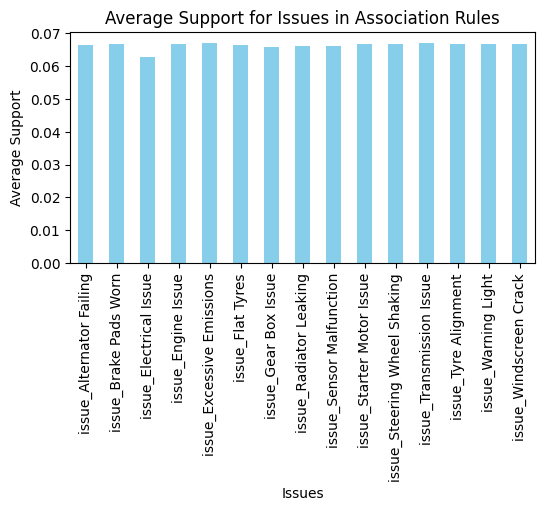

In [16]:
# Plot the bar graph
plt.figure(figsize=(6, 3))
issue_confidence.plot(kind='bar', color='skyblue')
plt.title('Average Support for Issues in Association Rules')
plt.xlabel('Issues')
plt.ylabel('Average Support')
plt.show()

### The above graph shows there is not one clear issue that occurs more frequently than others.

### Gearbox of vehicles are one of the most important parts for a vehicle to function smoothly, and this could give us a hint to understand what kind of gearbox are more likely to cause issues.

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


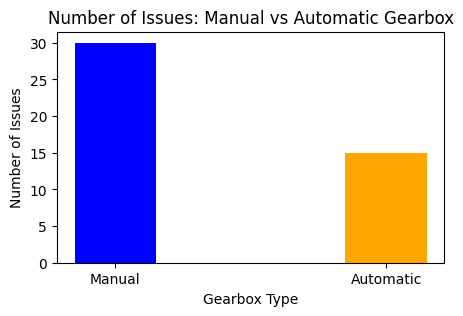

In [17]:
# Filter for Gearbox_Manual and Gearbox_Automatic in antecedents
manual_issues = filtered_rules_apr[filtered_rules_apr['antecedents'].apply(lambda x: 'Gearbox_Manual' in x)]
automatic_issues = filtered_rules_apr[filtered_rules_apr['antecedents'].apply(lambda x: 'Gearbox_Automatic' in x)]

# Count the number of unique issues in consequents for each gearbox type
manual_issue_count = manual_issues['consequents'].apply(lambda x: len([item for item in x if 'issue' in item])).sum()
automatic_issue_count = automatic_issues['consequents'].apply(lambda x: len([item for item in x if 'issue' in item])).sum()

# Create a DataFrame for plotting
gearbox_data = pd.DataFrame({
    'Gearbox Type': ['Manual', 'Automatic'],
    'Number of Issues': [manual_issue_count, automatic_issue_count]
})

# Plot the bar chart
plt.figure(figsize=(5, 3))
plt.bar(gearbox_data['Gearbox Type'], gearbox_data['Number of Issues'], color=['blue', 'orange'],width=0.3)
plt.title('Number of Issues: Manual vs Automatic Gearbox')
plt.xlabel('Gearbox Type')
plt.ylabel('Number of Issues')
plt.show()


### Although it looks tempting to assume that manual gearbox vehicles tend to have more issues, we must also consider the dataset.

In [18]:
filtered_df['Gearbox'].value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,count
Gearbox,
Manual,170277
Automatic,94330
Semi-Automatic,131
Hybrid,71


### There are roughly twice the number of records for manual gearbox when compared to automatic, and the same proportion is roughly maintained in the issues reported as well.

In [19]:
filtered_df['Fuel_type'].value_counts()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,count
Fuel_type,
Diesel,131645
Petrol,126608
Hybrid Petrol/Electric,4484
Hybrid Petrol/Electric Plug-in,851
Petrol Hybrid,380
Hydrogen,331
Petrol Plug-in Hybrid,258
Hybrid Diesel/Electric,107
Diesel Hybrid,47


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


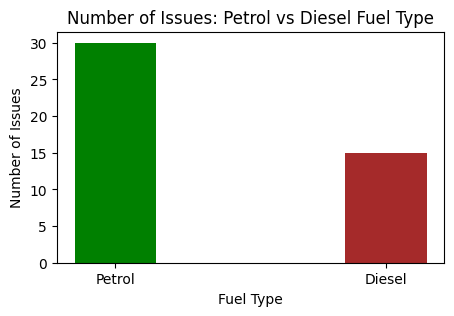

In [20]:
# Filter for petrol vs diesel in antecedents
petrol_issues = filtered_rules_apr[filtered_rules_apr['antecedents'].apply(lambda x: 'Fuel_type_Petrol' in x)]
diesel_issues = filtered_rules_apr[filtered_rules_apr['antecedents'].apply(lambda x: 'Fuel_type_Diesel' in x)]

# Count the number of unique issues in consequents for petrol and diesel
petrol_issues_count = manual_issues['consequents'].apply(lambda x: len([item for item in x if 'issue' in item])).sum()
diesel_issues_count = automatic_issues['consequents'].apply(lambda x: len([item for item in x if 'issue' in item])).sum()

# Create a DataFrame for plotting
fuel_data = pd.DataFrame({
    'Fuel Type': ['Petrol', 'Diesel'],
    'Number of Issues': [petrol_issues_count, diesel_issues_count]
})

# Plot the bar chart
plt.figure(figsize=(5, 3))
plt.bar(fuel_data['Fuel Type'], fuel_data['Number of Issues'], color=['green', 'brown'], width=0.3)
plt.title('Number of Issues: Petrol vs Diesel Fuel Type')
plt.xlabel('Fuel Type')
plt.ylabel('Number of Issues')
plt.show()

### For petrol vs diesel, we can clearly see that Petrol vehicles are reporting much more issues than diesel vehicles. Also, note that the number of records in the dataset are actually more for the diesel vehicles.  

### The Insurance companies could use this information and charge the pertrol vehicles a higher premium as there is evidence on more issues being reported in the petrol vehicles.

In [21]:
#using lift metric to observe correlation between antecedents and consequents
rules_lift = association_rules(frequent_items, metric="lift", min_threshold=2, num_itemsets = 5)
rules_lift

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(Maker_BMW),(Gearbox_Automatic),0.059027,0.356219,0.043239,0.732519,2.056372,1.0,0.022212,2.406826,0.545932,0.116231,0.584515,0.426951
1,(Gearbox_Automatic),(Maker_BMW),0.356219,0.059027,0.043239,0.121382,2.056372,1.0,0.022212,1.070969,0.797952,0.116231,0.066266,0.426951
2,(Gearbox_Automatic),(Maker_Jaguar),0.356219,0.030090,0.025860,0.072596,2.412667,1.0,0.015142,1.045834,0.909503,0.071744,0.043825,0.466017
3,(Maker_Jaguar),(Gearbox_Automatic),0.030090,0.356219,0.025860,0.859438,2.412667,1.0,0.015142,4.580042,0.603686,0.071744,0.781661,0.466017
4,(Gearbox_Automatic),(Maker_Land Rover),0.356219,0.037317,0.027956,0.078480,2.103032,1.0,0.014663,1.044668,0.814712,0.076470,0.042758,0.413810
5,(Maker_Land Rover),(Gearbox_Automatic),0.037317,0.356219,0.027956,0.749140,2.103032,1.0,0.014663,2.566294,0.544828,0.076470,0.610333,0.413810
6,(Gearbox_Automatic),(Maker_Mercedes-Benz),0.356219,0.032329,0.027488,0.077165,2.386877,1.0,0.015972,1.048585,0.902547,0.076131,0.046334,0.463708
7,(Maker_Mercedes-Benz),(Gearbox_Automatic),0.032329,0.356219,0.027488,0.850251,2.386877,1.0,0.015972,4.299071,0.600455,0.076131,0.767392,0.463708
8,(Genmodel_ID_94_9),(Maker_Vauxhall),0.020913,0.075673,0.020913,1.000000,13.214681,1.0,0.019331,inf,0.944070,0.276361,1.000000,0.638181
9,(Maker_Vauxhall),(Genmodel_ID_94_9),0.075673,0.020913,0.020913,0.276361,13.214681,1.0,0.019331,1.353005,1.000000,0.276361,0.260904,0.638181


#### From the above dataframe, which is filtered to threshold of 2 in the lift metric, we can see that several Makers like BMW, Jaguar, Mercedes Benz, Land Rover, Vauxhall etc are all showcasing a high lift with Automatic Gearbox, indicating that our dataset contains more records of vehicles that contain automatic gearbox.

In [22]:
sel_cols = filtered_df[['Maker', 'Genmodel_ID', 'issue']]
encoded_cols = pd.get_dummies(sel_cols)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [23]:
encoded_cols.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Maker_Abarth,Maker_Alfa Romeo,Maker_Aston Martin,Maker_Audi,Maker_BMW,Maker_Bentley,Maker_Brooke,Maker_Bugatti,Maker_Cadillac,Maker_Caterham,...,issue_Flat Tyres,issue_Gear Box Issue,issue_Radiator Leaking,issue_Sensor Malfunction,issue_Starter Motor Issue,issue_Steering Wheel Shaking,issue_Transmission Issue,issue_Tyre Alignment,issue_Warning Light,issue_Windscreen Crack
0,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,True,False,False,False,False,...,True,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,True,False,False,False,False,...,False,True,False,False,False,False,False,False,False,False
4,False,False,False,False,False,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


## FP Growth

In [24]:
#Finding association rules using fp growth algorithm
frequent_items_fpg = fpgrowth(vehicles_assoc, min_support=0.05, use_colnames=True) #5% support
print(frequent_items_fpg)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


     support                               itemsets
0   0.478111                     (Fuel_type_Petrol)
1   0.356219                    (Gearbox_Automatic)
2   0.066901               (issue_Electrical Issue)
3   0.066690                (issue_Brake Pads Worn)
4   0.066478                     (issue_Flat Tyres)
5   0.065983                 (issue_Gear Box Issue)
6   0.066667               (issue_Windscreen Crack)
7   0.066180               (issue_Radiator Leaking)
8   0.066935                   (issue_Engine Issue)
9   0.066724                 (issue_Tyre Alignment)
10  0.066863                  (issue_Warning Light)
11  0.066878            (issue_Starter Motor Issue)
12  0.066890         (issue_Steering Wheel Shaking)
13  0.066308             (issue_Sensor Malfunction)
14  0.497132                     (Fuel_type_Diesel)
15  0.067097            (issue_Excessive Emissions)
16  0.066437             (issue_Alternator Failing)
17  0.066969             (issue_Transmission Issue)
18  0.643018

In [25]:
rules_fpg = association_rules(frequent_items_fpg, metric="confidence", min_threshold=0.05,num_itemsets = 5)
rules_fpg

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,representativity,leverage,conviction,zhangs_metric,jaccard,certainty,kulczynski
0,(Gearbox_Manual),(Fuel_type_Petrol),0.643018,0.478111,0.352099,0.547572,1.145284,1.0,0.044665,1.153531,0.355352,0.457848,0.133097,0.642005
1,(Fuel_type_Petrol),(Gearbox_Manual),0.478111,0.643018,0.352099,0.736438,1.145284,1.0,0.044665,1.354453,0.243067,0.457848,0.261695,0.642005
2,(Gearbox_Automatic),(Fuel_type_Petrol),0.356219,0.478111,0.125532,0.352401,0.737070,1.0,-0.044780,0.805884,-0.356543,0.177106,-0.240874,0.307480
3,(Fuel_type_Petrol),(Gearbox_Automatic),0.478111,0.356219,0.125532,0.262558,0.737070,1.0,-0.044780,0.872993,-0.406007,0.177106,-0.145485,0.307480
4,(Fuel_type_Diesel),(Gearbox_Automatic),0.497132,0.356219,0.206624,0.415633,1.166790,1.0,0.029537,1.101672,0.284266,0.319493,0.092289,0.497841
5,(Gearbox_Automatic),(Fuel_type_Diesel),0.356219,0.497132,0.206624,0.580049,1.166790,1.0,0.029537,1.197444,0.222045,0.319493,0.164888,0.497841
6,(Fuel_type_Diesel),(Gearbox_Manual),0.497132,0.643018,0.290341,0.584033,0.908268,1.0,-0.029324,0.858197,-0.167250,0.341655,-0.165234,0.517781
7,(Gearbox_Manual),(Fuel_type_Diesel),0.643018,0.497132,0.290341,0.451529,0.908268,1.0,-0.029324,0.916854,-0.220527,0.341655,-0.090686,0.517781
8,(Fuel_type_Petrol),(Maker_Ford),0.478111,0.101488,0.053348,0.111581,1.099444,1.0,0.004825,1.011360,0.173311,0.101373,0.011232,0.318618
9,(Maker_Ford),(Fuel_type_Petrol),0.101488,0.478111,0.053348,0.525656,1.099444,1.0,0.004825,1.100233,0.100666,0.101373,0.091102,0.318618


### fpgrowth doesnt show any issues. This is due to the algorithm's way of working where FPGrowth uses a tree structure (FP-tree) to compress the dataset and generate itemsets more efficiently but may drop items with lower co-occurrence in the tree structure.


## 4. Temporal Clustering and Seasonality Trend Analysis using Clustering techniques
  
  *   Feature columns selection
  *   K-Means Clustering
  *   Silhouette_scoring

   



In [32]:
# Understanding the dataset
# Load the raw dataset to work on anomaly
file_path = 'vehicle_claims_preprocessed.csv'
filtered_df = pd.read_csv(file_path)
filtered_df.info()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264809 entries, 0 to 264808
Data columns (total 21 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         264809 non-null  int64  
 1   Maker              264809 non-null  object 
 2   Genmodel_ID        264809 non-null  object 
 3   Color              264809 non-null  object 
 4   Reg_year           264809 non-null  int64  
 5   Bodytype           264809 non-null  object 
 6   Runned_Miles       264809 non-null  float64
 7   Engin_size         264809 non-null  float64
 8   Gearbox            264809 non-null  object 
 9   Fuel_type          264809 non-null  object 
 10  Price              264809 non-null  float64
 11  Seat_num           264809 non-null  int64  
 12  Door_num           264809 non-null  int64  
 13  issue              264809 non-null  object 
 14  issue_id           264809 non-null  int64  
 15  breakdown_date     264809 non-null  object 
 16  re

In [36]:
# Convert date columns to datetime
date_columns = ['breakdown_date', 'repair_date']
for col in date_columns:
    filtered_df[col] = pd.to_datetime(filtered_df[col], errors='coerce')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [37]:
# Dropping rows where all key columns are NaN
key_columns = [
    'Maker', 'Genmodel_ID', 'Color', 'Reg_year',
    'Bodytype', 'Price', 'issue', 'breakdown_date'
]
df = filtered_df.dropna(subset=key_columns, how='all')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [38]:
# Displaying the cleaned data structure and a preview
print(df.info())
print(df.head())

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 264809 entries, 0 to 264808
Data columns (total 21 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   Unnamed: 0         264809 non-null  int64         
 1   Maker              264809 non-null  object        
 2   Genmodel_ID        264809 non-null  object        
 3   Color              264809 non-null  object        
 4   Reg_year           264809 non-null  int64         
 5   Bodytype           264809 non-null  object        
 6   Runned_Miles       264809 non-null  float64       
 7   Engin_size         264809 non-null  float64       
 8   Gearbox            264809 non-null  object        
 9   Fuel_type          264809 non-null  object        
 10  Price              264809 non-null  float64       
 11  Seat_num           264809 non-null  int64         
 12  Door_num           264809 non-null  int64         
 13  issue              264809 non-null  object  

In [39]:
# Converting breakdown_date to monthly periods
df['breakdown_month'] = df['breakdown_date'].dt.to_period('M')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [40]:
# Aggregating the data: count claims per month for each Maker, Genmodel, and issue
time_series_df = df.groupby(
                              ['Maker', 'Genmodel_ID', 'issue', 'breakdown_month']
                            ).size().reset_index(name='claim_counts')

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [41]:
# Pivoting to get time series for each group (Maker, Genmodel, issue)
time_series_pivot = time_series_df.pivot_table(
    index=['Maker', 'Genmodel_ID', 'issue'],
    columns='breakdown_month',
    values='claim_counts',
    fill_value=0
)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [42]:
# Resetting the index for easier processing
time_series_pivot.reset_index(inplace=True)
time_series_pivot.head()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


breakdown_month,Maker,Genmodel_ID,issue,2012-12,2013-08,2013-09,2013-10,2013-11,2014-01,2014-02,...,2020-09,2020-10,2020-11,2020-12,2021-01,2021-02,2021-03,2021-04,2021-05,2021-06
0,Abarth,2_1,Alternator Failing,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,Abarth,2_1,Brake Pads Worn,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,Abarth,2_1,Electrical Issue,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,Abarth,2_1,Engine Issue,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Abarth,2_1,Excessive Emissions,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [43]:
# Scaling the time-series columns for standardization
from sklearn.preprocessing import StandardScaler

# Extracting time-series data for normalization
time_series_data = time_series_pivot.iloc[:, 3:].values  # Excluding non-time-series columns

# Normalizing the time-series data
scaler = StandardScaler()
time_series_normalized = scaler.fit_transform(time_series_data)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


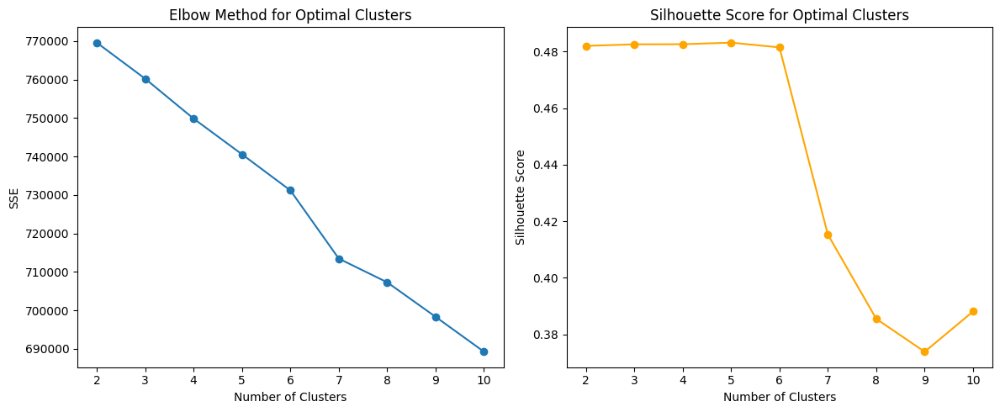

In [44]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Determining the optimal number of clusters using the elbow method and silhouette score
sse = []
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(time_series_normalized)
    sse.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(time_series_normalized, cluster_labels))

# Plot the elbow curve
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(k_values, sse, marker='o')
plt.title('Elbow Method for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('SSE')

# Plot silhouette scores
plt.subplot(1, 2, 2)
plt.plot(k_values, silhouette_scores, marker='o', color='orange')
plt.title('Silhouette Score for Optimal Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()



In [45]:
# k=7 there is a sudden drop in sse
optimal_k = 7
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
time_series_pivot['cluster'] = kmeans.fit_predict(time_series_normalized)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [46]:
# Add cluster labels back to the original pivoted DataFrame
time_series_pivot['cluster'] = kmeans.labels_

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


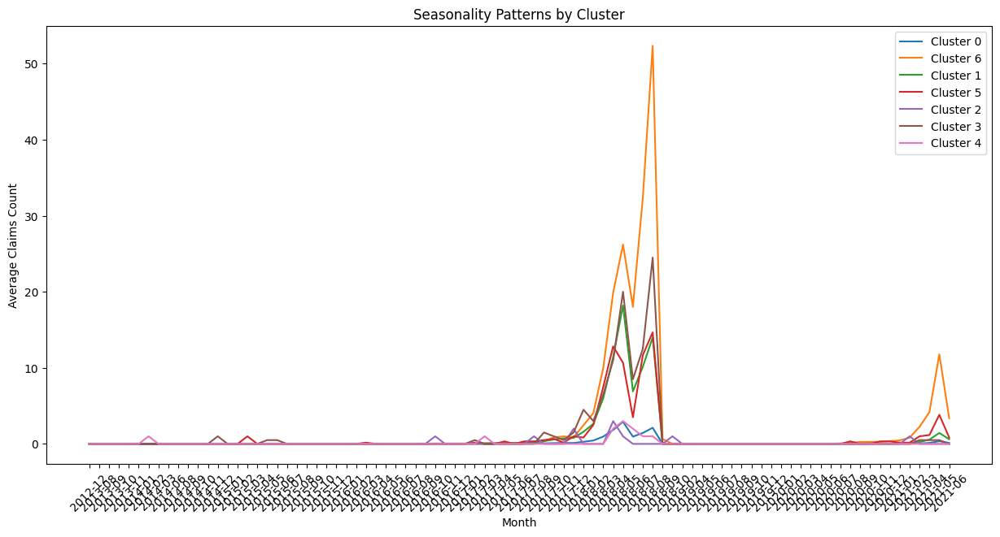

In [47]:
# Plotting seasonal patterns for each cluster
clusters = time_series_pivot['cluster'].unique()

plt.figure(figsize=(15, 7))
for cluster in clusters:
    cluster_data = time_series_pivot[time_series_pivot['cluster'] == cluster]
    cluster_mean = cluster_data.iloc[:, 3:-1].mean(axis=0)
    plt.plot(cluster_mean.index.astype(str), cluster_mean, label=f'Cluster {cluster}')

plt.title('Seasonality Patterns by Cluster')
plt.xlabel('Month')
plt.ylabel('Average Claims Count')
plt.legend()
plt.xticks(rotation=45)
plt.show()


In [48]:
# Extracting year and month from breakdown_date
df['year'] = df['breakdown_date'].dt.year
df['month'] = df['breakdown_date'].dt.month

# Aggregating data by year and month
year_month_agg = df.groupby(['year', 'month']).size().reset_index(name='claim_count')

# Pivoting the data for easier visualization
year_month_pivot = year_month_agg.pivot(index='month', columns='year', values='claim_count').fillna(0)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


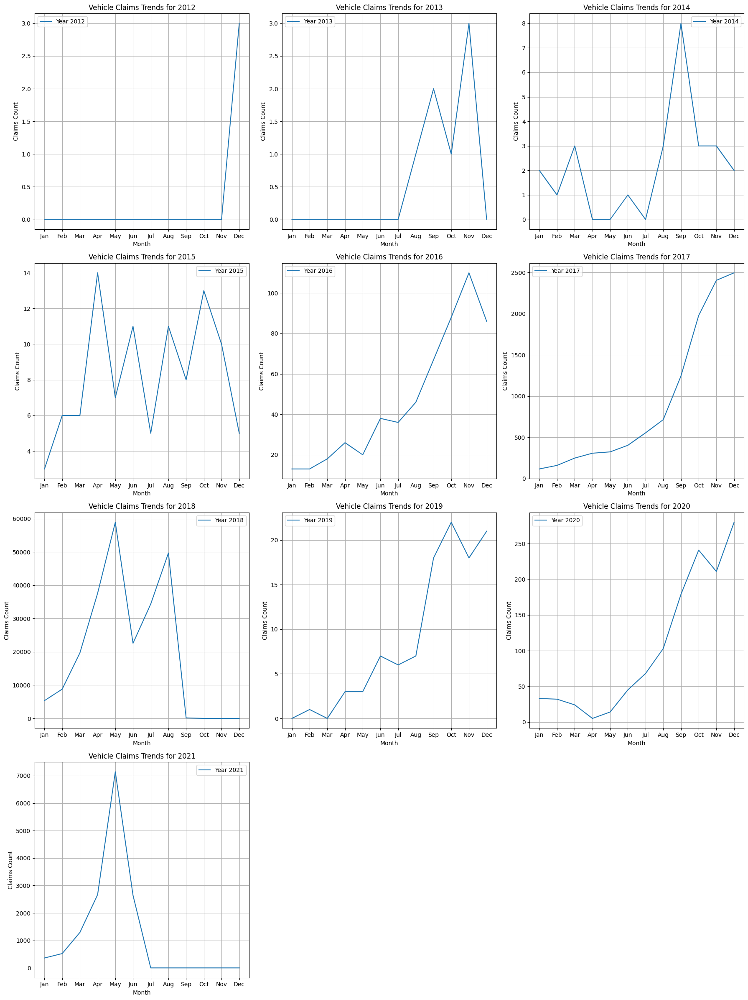

In [49]:
# Plotting trends for each year in separate subplots (3 in a row, 4 rows)
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 6 * 4))
axes = axes.flatten()  # Flattening the axes array to make indexing easier

# Plotting each year's data on a separate subplot
for i, year in enumerate(year_month_pivot.columns):
    axes[i].plot(year_month_pivot.index, year_month_pivot[year], label=f'Year {year}')
    axes[i].set_title(f'Vehicle Claims Trends for {year}')
    axes[i].set_xlabel('Month')
    axes[i].set_ylabel('Claims Count')
    axes[i].set_xticks(range(1, 13))
    axes[i].set_xticklabels(['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    axes[i].grid(True)
    axes[i].legend()

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


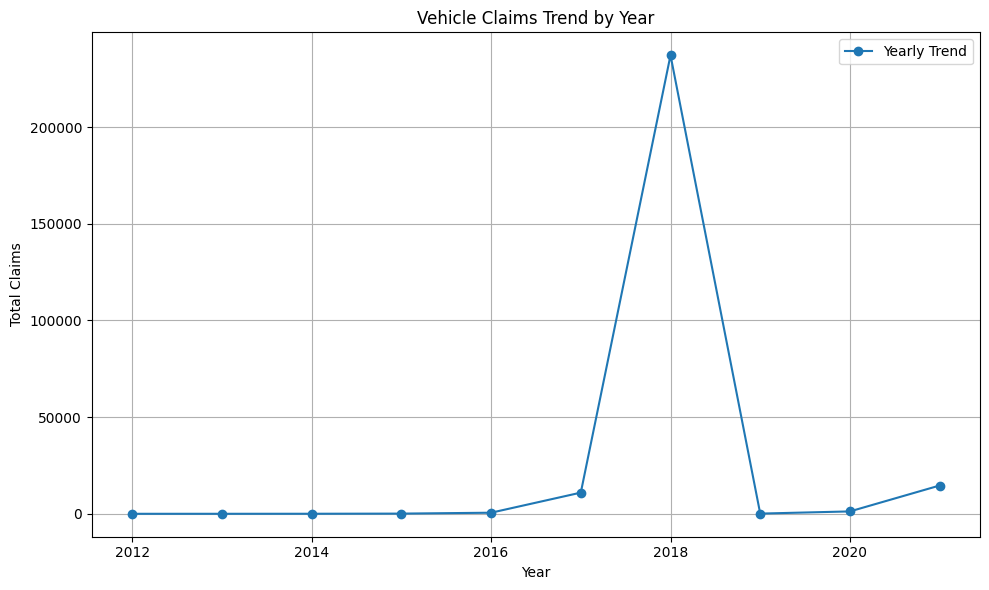

In [50]:

# Aggregating data by year (for year-based trend)
yearly_agg = df.groupby('year').size().reset_index(name='total_claims')

# plotting the time-series plot with years on the x-axis (yearly trend)
plt.figure(figsize=(10, 6))
plt.plot(yearly_agg['year'], yearly_agg['total_claims'], marker='o', label='Yearly Trend')
plt.title('Vehicle Claims Trend by Year')
plt.xlabel('Year')
plt.ylabel('Total Claims')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


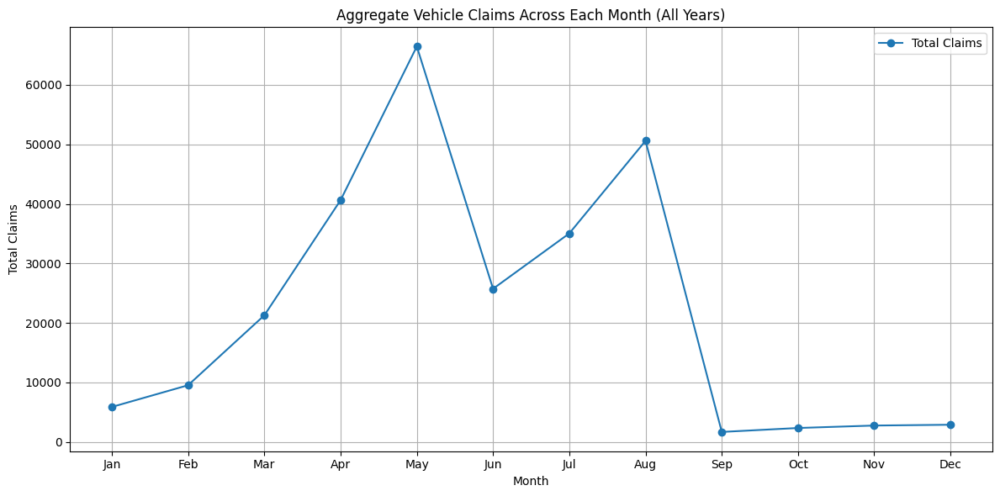

In [51]:
# Aggregating data by month across all years
monthly_aggregate = df.groupby('month').size().reset_index(name='total_claims')

# Plotting the aggregated claim counts across months
plt.figure(figsize=(12, 6))
plt.plot(monthly_aggregate['month'], monthly_aggregate['total_claims'], marker='o', label='Total Claims')
plt.title('Aggregate Vehicle Claims Across Each Month (All Years)')
plt.xlabel('Month')
plt.ylabel('Total Claims')
plt.xticks(range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


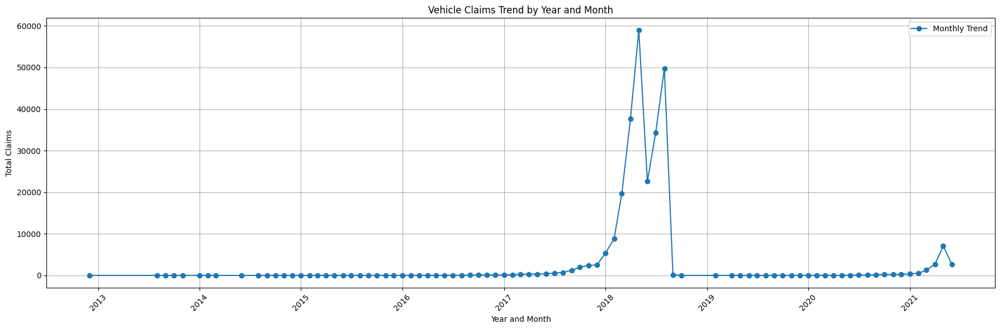

In [52]:
# Aggregating data by year and month (for month-year-based trend)
monthly_agg = df.groupby(['year', 'month']).size().reset_index(name='total_claims')

# Combining year and month into a datetime object for proper x-axis labeling
monthly_agg['year_month'] = pd.to_datetime(monthly_agg[['year', 'month']].assign(day=1))

plt.figure(figsize=(18, 6))
plt.plot(monthly_agg['year_month'], monthly_agg['total_claims'], marker='o', label='Monthly Trend')
plt.title('Vehicle Claims Trend by Year and Month')
plt.xlabel('Year and Month')
plt.ylabel('Total Claims')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.legend()
plt.tight_layout()
plt.show()

In [53]:

# Pivot the data so each row is a year and columns are months
monthly_pivot = monthly_agg.pivot(index='year', columns='month', values='total_claims').fillna(0)

# Normalize the data (optional, but important for clustering)
scaler = StandardScaler()
monthly_pivot_scaled = scaler.fit_transform(monthly_pivot)

# Perform K-Means clustering
n_clusters = 7
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
monthly_pivot['cluster'] = kmeans.fit_predict(monthly_pivot_scaled)

print(monthly_pivot.head())


month     1     2     3     4     5     6     7     8     9    10     11  \
year                                                                       
2012    0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0   0.0    0.0   
2013    0.0   0.0   0.0   0.0   0.0   0.0   0.0   1.0   2.0   1.0    3.0   
2014    2.0   1.0   3.0   0.0   0.0   1.0   0.0   3.0   8.0   3.0    3.0   
2015    3.0   6.0   6.0  14.0   7.0  11.0   5.0  11.0   8.0  13.0   10.0   
2016   13.0  13.0  18.0  26.0  20.0  38.0  36.0  46.0  67.0  88.0  110.0   

month    12  cluster  
year                  
2012    3.0        6  
2013    0.0        6  
2014    2.0        6  
2015    5.0        0  
2016   86.0        5  


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


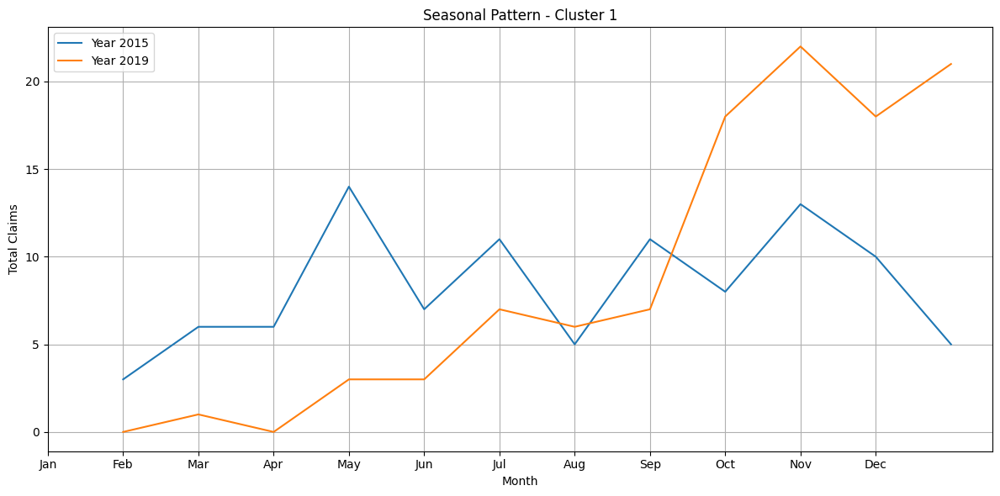

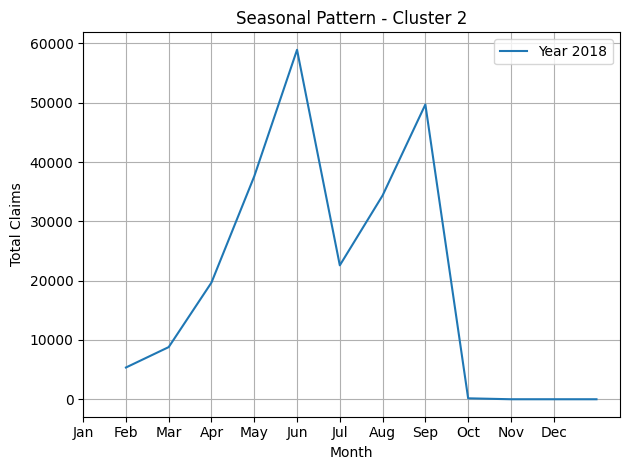

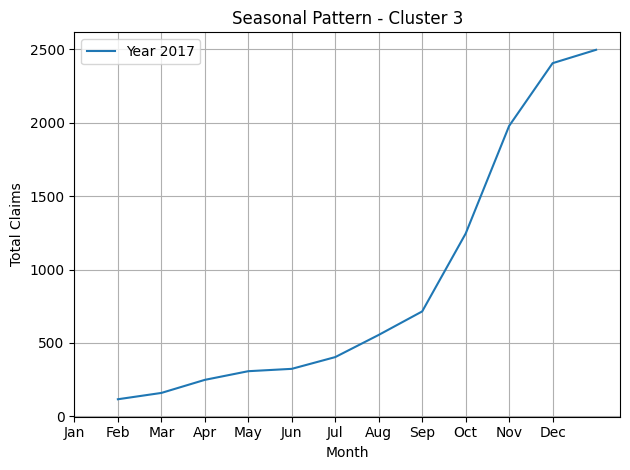

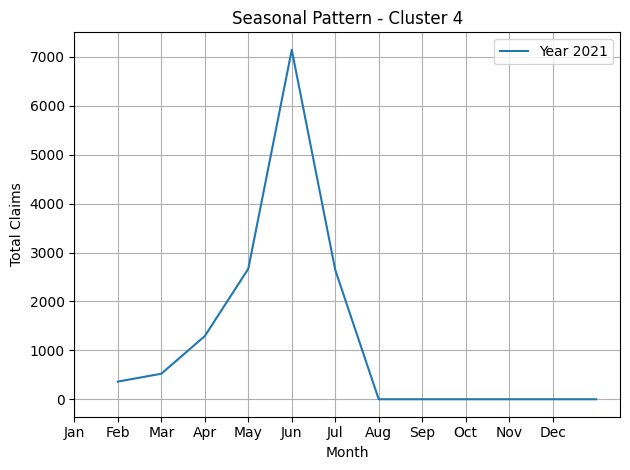

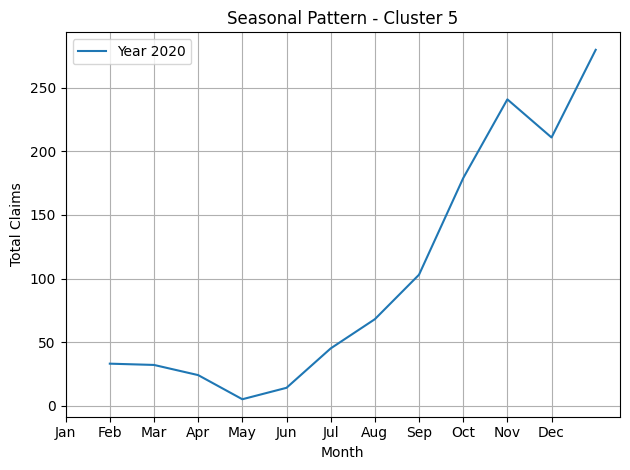

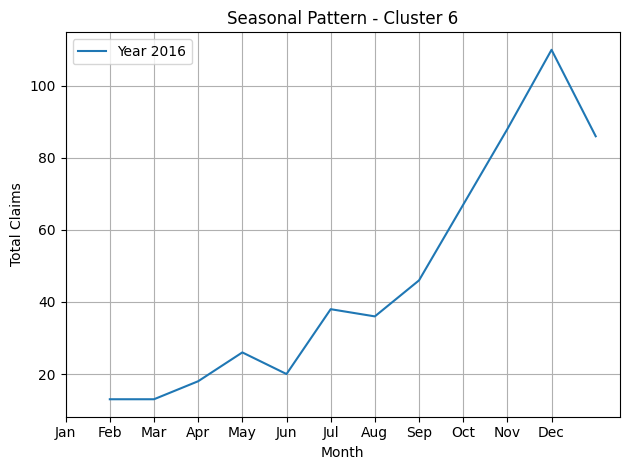

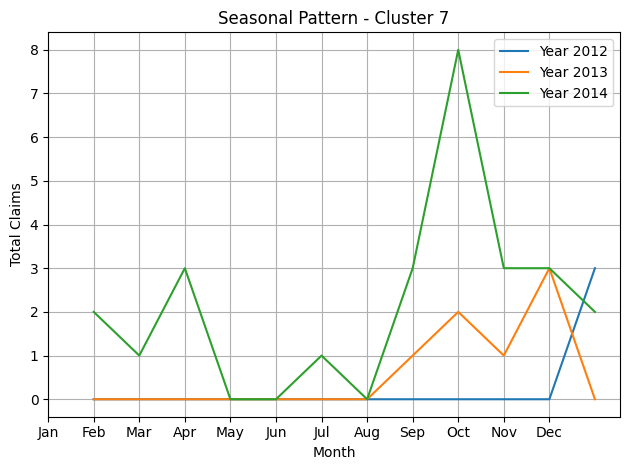

In [54]:
# Visualizing the clusters
plt.figure(figsize=(12, 6))
n_clusters = len(np.unique(monthly_pivot['cluster']))  # Get the number of clusters

for cluster in range(n_clusters):
    # Filter the rows for each cluster
    cluster_years = monthly_pivot[monthly_pivot['cluster'] == cluster].index

    for year in cluster_years:
        # Exclude the 'cluster' column and ensure only months are selected (12 months)
        months_data = monthly_pivot.loc[year, monthly_pivot.columns.difference(['cluster'])]

        # Ensure that months_data contains exactly 12 values (for 12 months)
        plt.plot(months_data.index, months_data.values, label=f'Year {year}')

    plt.title(f'Seasonal Pattern - Cluster {cluster + 1}')
    plt.xlabel('Month')
    plt.ylabel('Total Claims')
    plt.xticks(range(12), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


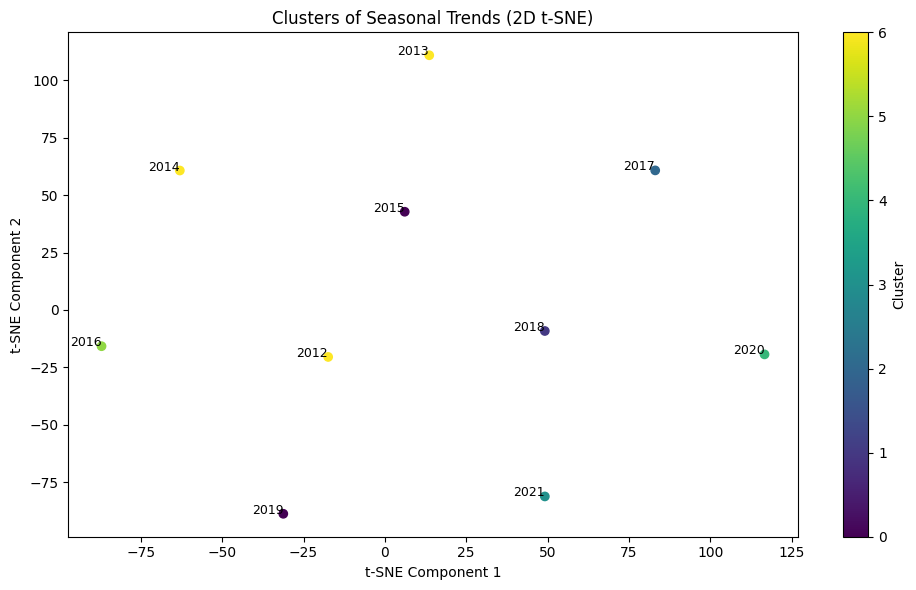

In [55]:
from sklearn.manifold import TSNE

# Setting the perplexity to a smaller value if the number of samples (years) is small
perplexity_value = min(30, len(monthly_pivot)) - 1  # Ensuring perplexity is less than the number of samples

# Applying t-SNE for 2D visualization with the adjusted perplexity
tsne = TSNE(n_components=2, perplexity=perplexity_value, random_state=42)
tsne_result = tsne.fit_transform(monthly_pivot_scaled)

# Plotting the t-SNE results in 2D
plt.figure(figsize=(10, 6))
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=monthly_pivot['cluster'], cmap='viridis', marker='o')

# Adding labels for each point (year) to the plot
for i, year in enumerate(monthly_pivot.index):
    plt.text(tsne_result[i, 0], tsne_result[i, 1], str(year), fontsize=9, ha='right')

# Customizing plot
plt.title('Clusters of Seasonal Trends (2D t-SNE)')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.colorbar(label='Cluster')
plt.tight_layout()
plt.show()


In [56]:
!pip install tslearn

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.4/374.4 kB 6.6 MB/s eta 0:00:00


In [57]:
# Required Libraries for this specific task
from tslearn.utils import to_time_series_dataset
from tslearn.preprocessing import TimeSeriesResampler
from tslearn.clustering import TimeSeriesKMeans
from tslearn.clustering import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage
from tslearn.metrics import cdist_dtw

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [58]:
time_series_pivot

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


breakdown_month,Maker,Genmodel_ID,issue,2012-12,2013-08,2013-09,2013-10,2013-11,2014-01,2014-02,...,2020-10,2020-11,2020-12,2021-01,2021-02,2021-03,2021-04,2021-05,2021-06,cluster
0,Abarth,2_1,Alternator Failing,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
1,Abarth,2_1,Brake Pads Worn,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
2,Abarth,2_1,Electrical Issue,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
3,Abarth,2_1,Engine Issue,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,Abarth,2_1,Excessive Emissions,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9237,Volvo,96_9,Warning Light,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
9238,Volvo,96_9,Windscreen Crack,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
9239,Westfield,97_1,Excessive Emissions,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
9240,Zenos,99_1,Alternator Failing,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [59]:

# Extracting Time-Series Data
time_series_data = time_series_pivot.iloc[:, 5:].values

print(time_series_data)

[[0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Euclidean k-means
0.359 --> 0.172 --> 0.172 --> 
DBA k-means
Init 1
2.053 --> 1.599 --> 1.599 --> 
Init 2
2.053 --> 1.599 --> 1.599 --> 
Soft-DTW k-means
10.419 --> 6.115 --> 6.106 --> 6.100 --> 6.094 --> 6.091 --> 6.088 --> 6.087 --> 6.087 --> 6.087 --> 6.087 --> 


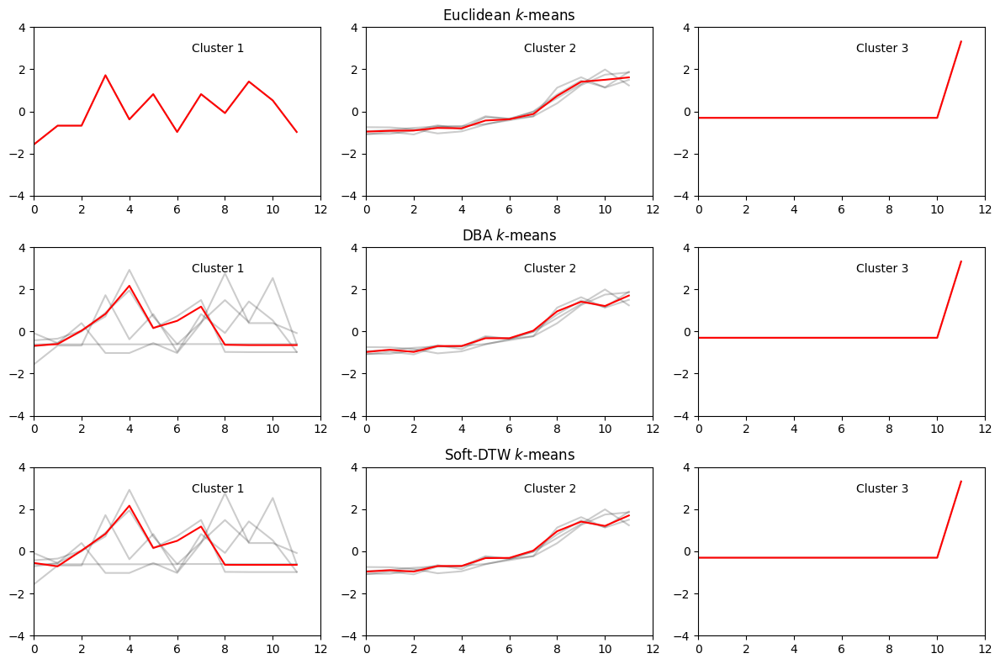

In [60]:
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance, TimeSeriesResampler


# Aggregate claims by month per year (to get time series of claims)
monthly_claims = df.groupby(['year', 'month']).size().reset_index(name='claim_count')

# Pivot the data to create time series (years as rows, months as columns)
monthly_pivot = monthly_claims.pivot(index='year', columns='month', values='claim_count').fillna(0)

# Convert the data into a 3D array: (n_samples, time_steps, n_features)
# Time steps = 12 months (1 per year), n_features = 1 (claims count)
X_train = monthly_pivot.values  # (n_years, n_months)

# Reshape into the required format: (n_samples, time_steps, n_features)
X_train = X_train[:, :, np.newaxis]

# Preprocess the data (scale and resample)
X_train = TimeSeriesScalerMeanVariance().fit_transform(X_train)  # Standard scaling

# Make the time series shorter (optional, can remove if not needed)
X_train = TimeSeriesResampler(sz=12).fit_transform(X_train)  # Resample to 12 months per time series
sz = X_train.shape[1]  # Time steps (12 months)

# Euclidean k-means clustering
print("Euclidean k-means")
km = TimeSeriesKMeans(n_clusters=7, verbose=True, random_state=42)
y_pred = km.fit_predict(X_train)

plt.figure(figsize=(12, 8))
for yi in range(3):
    plt.subplot(3, 3, yi + 1)
    for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85, f'Cluster {yi + 1}', transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Euclidean $k$-means")

# DBA-k-means clustering
print("DBA k-means")
dba_km = TimeSeriesKMeans(n_clusters=3,
                          n_init=2,
                          metric="dtw",
                          verbose=True,
                          max_iter_barycenter=10,
                          random_state=42)
y_pred = dba_km.fit_predict(X_train)

for yi in range(3):
    plt.subplot(3, 3, 4 + yi)
    for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(dba_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85, f'Cluster {yi + 1}', transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("DBA $k$-means")

# Soft-DTW-k-means clustering
print("Soft-DTW k-means")
sdtw_km = TimeSeriesKMeans(n_clusters=3,
                           metric="softdtw",
                           metric_params={"gamma": .01},
                           verbose=True,
                           random_state=42)
y_pred = sdtw_km.fit_predict(X_train)

for yi in range(3):
    plt.subplot(3, 3, 7 + yi)
    for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(sdtw_km.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.text(0.55, 0.85, f'Cluster {yi + 1}', transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("Soft-DTW $k$-means")

plt.tight_layout()
plt.show()


In [61]:
print(y_pred)


[2 0 0 0 1 1 0 1 1 0]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [62]:
print(km.cluster_centers_)


[[[-1.56961369]
  [-0.67269158]
  [-0.67269158]
  [ 1.71910071]
  [-0.37371755]
  [ 0.8221786 ]
  [-0.97166562]
  [ 0.8221786 ]
  [-0.07474351]
  [ 1.42012668]
  [ 0.52320456]
  [-0.97166562]]

 [[-0.95681059]
  [-0.91606705]
  [-0.9027377 ]
  [-0.78053675]
  [-0.79917196]
  [-0.4283348 ]
  [-0.36956362]
  [-0.12012854]
  [ 0.74138819]
  [ 1.40936374]
  [ 1.5045247 ]
  [ 1.61807438]]

 [[-0.30151134]
  [-0.30151134]
  [-0.30151134]
  [-0.30151134]
  [-0.30151134]
  [-0.30151134]
  [-0.30151134]
  [-0.30151134]
  [-0.30151134]
  [-0.30151134]
  [-0.30151134]
  [ 3.31662479]]

 [[-0.7165686 ]
  [-0.54533792]
  [-0.00400234]
  [ 0.88670548]
  [ 1.94735131]
  [ 0.14013173]
  [ 0.72586597]
  [ 1.48884684]
  [-0.97490619]
  [-0.98266228]
  [-0.982712  ]
  [-0.982712  ]]

 [[-0.61159284]
  [-0.61159284]
  [-0.61159284]
  [-0.61159284]
  [-0.61159284]
  [-0.61159284]
  [-0.61159284]
  [ 0.43685203]
  [ 1.4852969 ]
  [ 0.43685203]
  [ 2.53374176]
  [-0.61159284]]

 [[-0.07881104]
  [-0.55167728

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [63]:
# Focusing on the 'issues' column and counting the frequency of each issue for each month per year
issues_by_month = df.groupby(['year', 'month', 'issue']).size().reset_index(name='issue_count')
print(issues_by_month)

     year  month                   issue  issue_count
0    2012     12            Engine Issue            1
1    2012     12  Steering Wheel Shaking            1
2    2012     12        Windscreen Crack            1
3    2013      8     Starter Motor Issue            1
4    2013      9          Tyre Alignment            1
..    ...    ...                     ...          ...
888  2021      6  Steering Wheel Shaking          188
889  2021      6      Transmission Issue          169
890  2021      6          Tyre Alignment          168
891  2021      6           Warning Light          208
892  2021      6        Windscreen Crack          168

[893 rows x 4 columns]


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [64]:
# Pivoting the data to create a time series of issue counts for each month
monthly_issues = issues_by_month.pivot_table(index=['year', 'month'], columns='issue', values='issue_count', fill_value=0)

# Resetting index so that 'year' and 'month' are columns
monthly_issues_reset = monthly_issues.reset_index()

# Pivoting the data to have months as index and years as columns
monthly_issues_pivot = monthly_issues_reset.pivot(index='month', columns='year', values=monthly_issues.columns).fillna(0)

# Printing the pivoted DataFrame
print(monthly_issues_pivot)


issue Alternator Failing                                                 \
year                2012 2013 2014 2015  2016   2017    2018 2019  2020   
month                                                                     
1                    0.0  0.0  0.0  0.0   0.0    6.0   367.0  0.0   0.0   
2                    0.0  0.0  0.0  0.0   1.0   17.0   585.0  0.0   2.0   
3                    0.0  0.0  0.0  1.0   3.0   23.0  1286.0  0.0   1.0   
4                    0.0  0.0  0.0  1.0   1.0   33.0  2512.0  1.0   0.0   
5                    0.0  0.0  0.0  1.0   2.0   16.0  3840.0  0.0   2.0   
6                    0.0  0.0  1.0  1.0   4.0   28.0  1429.0  2.0   1.0   
7                    0.0  0.0  0.0  1.0   3.0   37.0  2306.0  0.0   5.0   
8                    0.0  0.0  0.0  1.0   5.0   51.0  3375.0  1.0   5.0   
9                    0.0  0.0  1.0  0.0   4.0   86.0     5.0  3.0  12.0   
10                   0.0  0.0  0.0  0.0   0.0  139.0     0.0  1.0  15.0   
11                   0.0 

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s


5.676 --> 

[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.0s


2.593 --> 2.582 --> 

[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s


2.577 --> 2.577 --> 


[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  49 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 199 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done 449 tasks      | elapsed:    0.0s


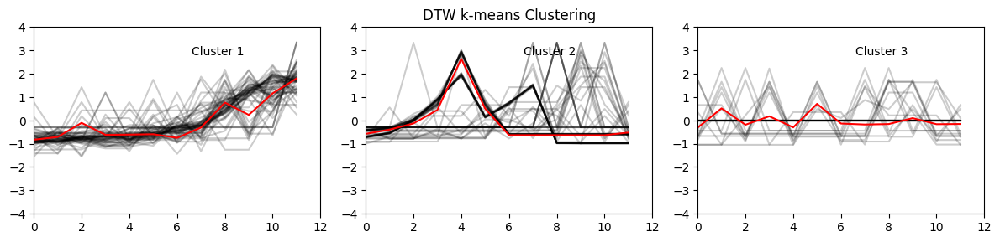

Cluster assignments: [2 2 0 0 1 0 1 0 0 1 2 2 1 0 0 0 1 1 0 1 2 2 2 1 0 0 1 0 0 1 0 1 2 1 0 0 1
 1 0 1 2 1 2 2 1 0 1 1 0 1 2 2 1 2 0 0 1 1 0 1 2 2 2 2 2 0 1 0 0 1 2 2 1 1
 0 0 1 1 0 1 2 2 1 2 1 0 1 0 0 1 2 1 2 2 0 0 1 2 0 1 0 2 0 1 0 0 1 0 0 1 2
 2 1 2 0 0 1 0 0 1 2 1 1 0 0 0 1 0 0 1 2 1 2 1 0 0 1 0 0 1 0 1 1 2 0 0 1 1
 0 1]


In [65]:
# Now, we have time series data, where each column corresponds to the count of an issue over 12 months across years

# Reshape the data for time series clustering
X_train = monthly_issues_pivot.values  # Shape will be (n_months, n_years)

# Reshape into the required format for time series clustering (n_samples, time_steps, n_features)
X_train = X_train.T[:, :, np.newaxis]  # Transpose and add a new axis to make it (n_years, n_months, 1)

# Scale the time series data
X_train = TimeSeriesScalerMeanVariance().fit_transform(X_train)

# Resample if needed (to ensure consistent time steps per year)
X_train = TimeSeriesResampler(sz=12).fit_transform(X_train)

# Perform clustering using k-means with Dynamic Time Warping (DTW)
km = TimeSeriesKMeans(n_clusters=3, metric="dtw", verbose=True, random_state=42)
y_pred = km.fit_predict(X_train)

# Plot the clustering results
plt.figure(figsize=(12, 8))
for yi in range(3):
    plt.subplot(3, 3, yi + 1)
    for xx in X_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)  # Plot the individual time series in each cluster
    plt.plot(km.cluster_centers_[yi].ravel(), "r-")  # Plot the cluster center
    plt.xlim(0, 12)  # x-axis represents months (1-12)
    plt.ylim(-4, 4)  # y-axis represents issue count
    plt.text(0.55, 0.85, f'Cluster {yi + 1}', transform=plt.gca().transAxes)
    if yi == 1:
        plt.title("DTW k-means Clustering")

plt.tight_layout()
plt.show()

# Inspect cluster assignments
print("Cluster assignments:", y_pred)
